### Imports


In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

comp='bf1'
import sys  # update paths
sys.path.append('../../')

import os 
import numpy as np 
import matplotlib.pyplot as plt
import copy
import meas_analysis.handy as hy
import scresonators.fit_resonator.ana_resonator as ana_res
import scresonators.fit_resonator.ana_tls as ana_tls
import seaborn as sns
import scipy.constants as cs
from scipy.optimize import curve_fit

colors = ['#4053d3', '#b51d14', '#ddb310','#658b38','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

if comp=='shannon':
    pth_base ='/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/'
elif comp=='bf1':
    pth_base='G:/'

folder = 'My Drive/Projects/Materials/'
pth = pth_base+folder
img_pth = pth+'Outputs/Resonators/'

meas = 'silicon-waffle-sing'
#meas = 'silicon-waffle-1108'

Could not import QickInstrument (will only work if running on rfsoc). If running on rfsoc, try install/update qick package
Warning failed to import AWG81180A
Warning failed to import Tek5014
Warning failed to import Tek70001
Warning failed to import M8195A
Could not load InstrumentManagerWindow
Could not load labbrick
Could not load Autonics TM4 Driver
Could not load Oxford Trition driver


In [3]:
import yaml

with open('resonator_meas.yaml', 'r') as file:
    sample_dict = yaml.safe_load(file)

matching_keys = [key for key, items in sample_dict.items() for item in items['meas'] if item == meas]
sample = matching_keys[0] if matching_keys else None

ind = sample_dict[sample]['meas'].index(meas)
print(ind)
# data_pth = pth_base+folder+'Data/'+sample_dict[sample]['pth']
data_pth = pth_base+folder+'Data/'+'241118-Resonator/'


2


In [4]:
sample_dict
params = sample_dict[sample]
params['temp']=0.04 
slope=params['slope'][ind]
print(slope)

1129.46


## Sweep power/temp, plot results

### Run sweep 

Counter({5983: 10, 6321: 10, 6680: 10, 6692: 10, 6993: 9, 7068: 9, 7475: 9, 7988: 9})
Counter({5983: 10, 6321: 10, 6680: 10, 6692: 10, 6993: 9, 7068: 9, 7475: 9, 7988: 9})
['res_5983_32768_wideleft', 'res_5983_16384_wideleft', 'res_5983_8192_wideleft', 'res_5983_4096_wideleft', 'res_5983_2048_wideleft', 'res_5983_1024_wideleft', 'res_5983_512_wideleft', 'res_5983_256_wideleft', 'res_5983_128_wideleft', 'res_5983_64_wideleft']
['res_6321_32768_wideleft', 'res_6321_16384_wideleft', 'res_6321_8192_wideleft', 'res_6321_4096_wideleft', 'res_6321_2048_wideleft', 'res_6321_1024_wideleft', 'res_6321_512_wideleft', 'res_6321_256_wideleft', 'res_6321_128_wideleft', 'res_6321_64_wideleft']
['res_6680_32768_wideleft', 'res_6680_16384_wideleft', 'res_6680_8192_wideleft', 'res_6680_4096_wideleft', 'res_6680_2048_wideleft', 'res_6680_1024_wideleft', 'res_6680_512_wideleft', 'res_6680_256_wideleft', 'res_6680_128_wideleft', 'res_6680_64_wideleft']
['res_6692_32768_wideleft', 'res_6692_16384_wideleft',

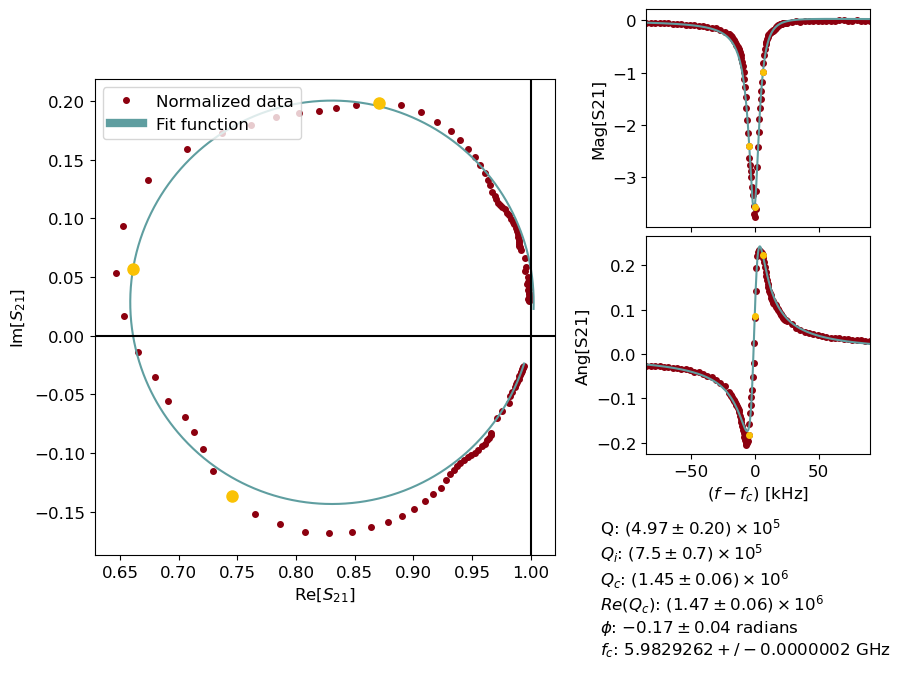

-36.020599913279625


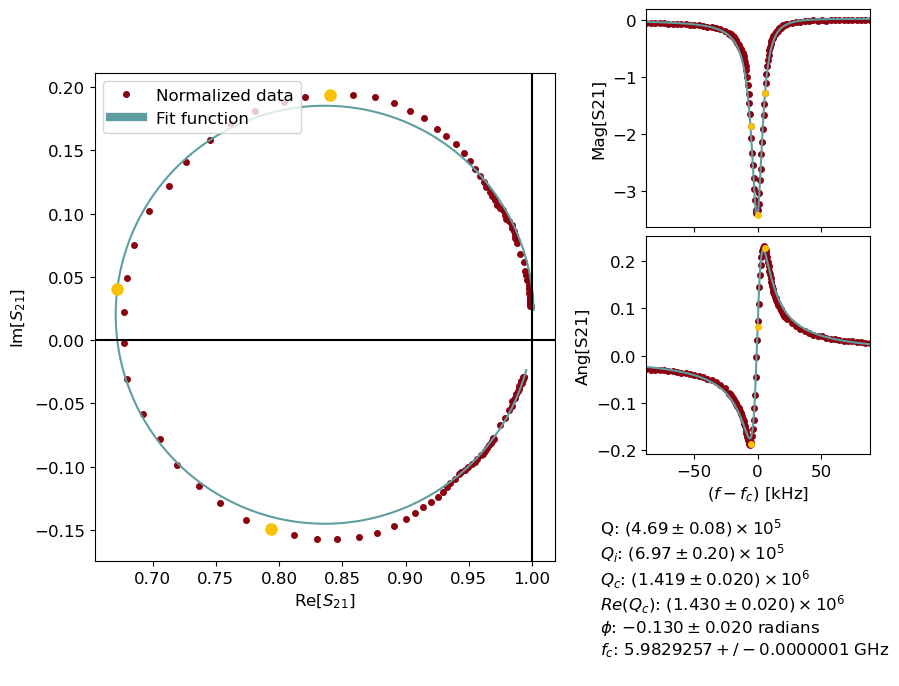

-42.04119982655925


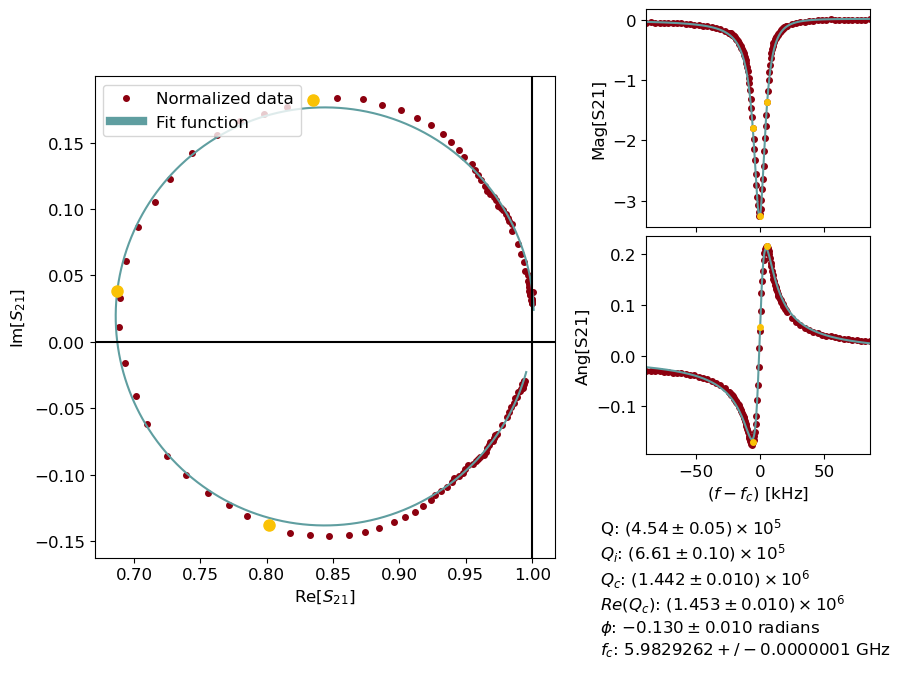

-48.061799739838875


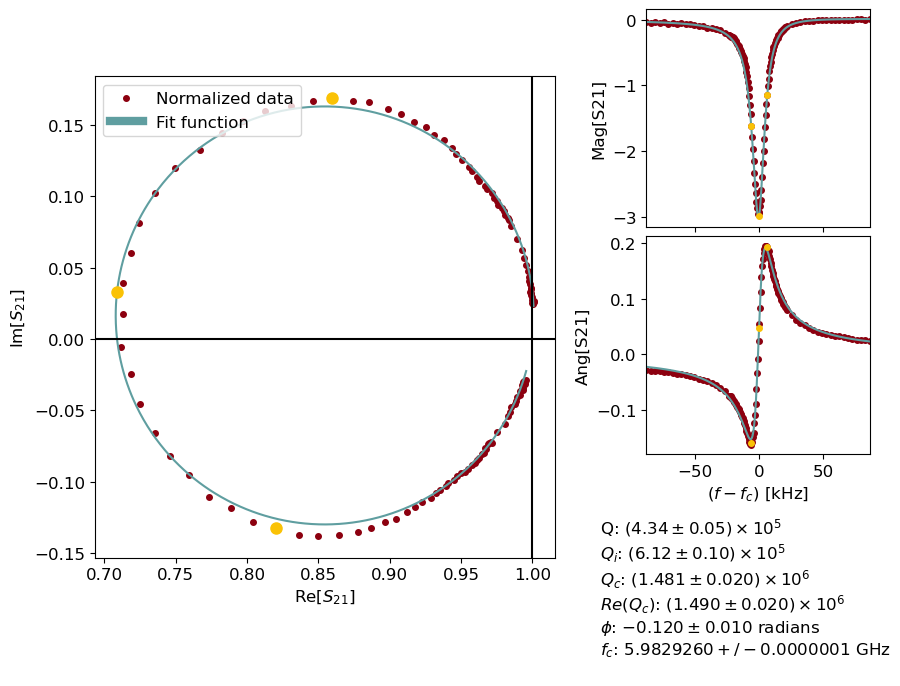

-54.0823996531185


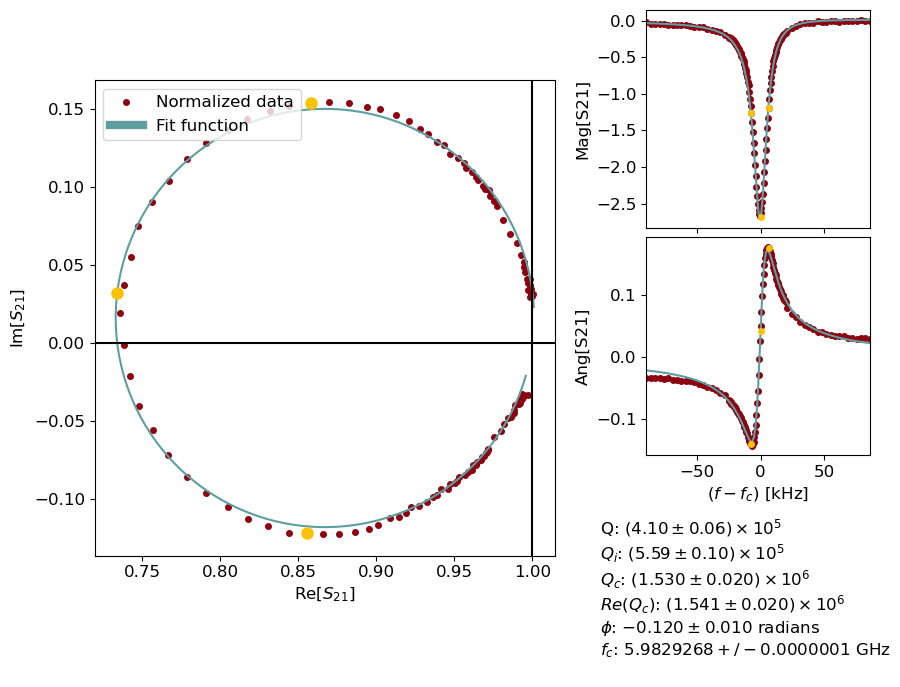

-60.102999566398125


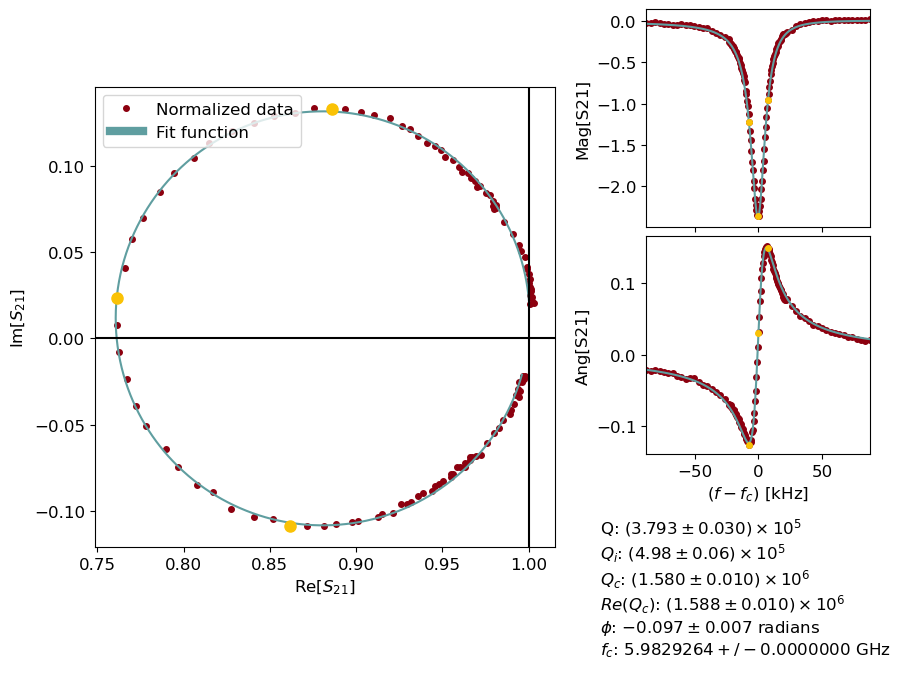

-66.12359947967775


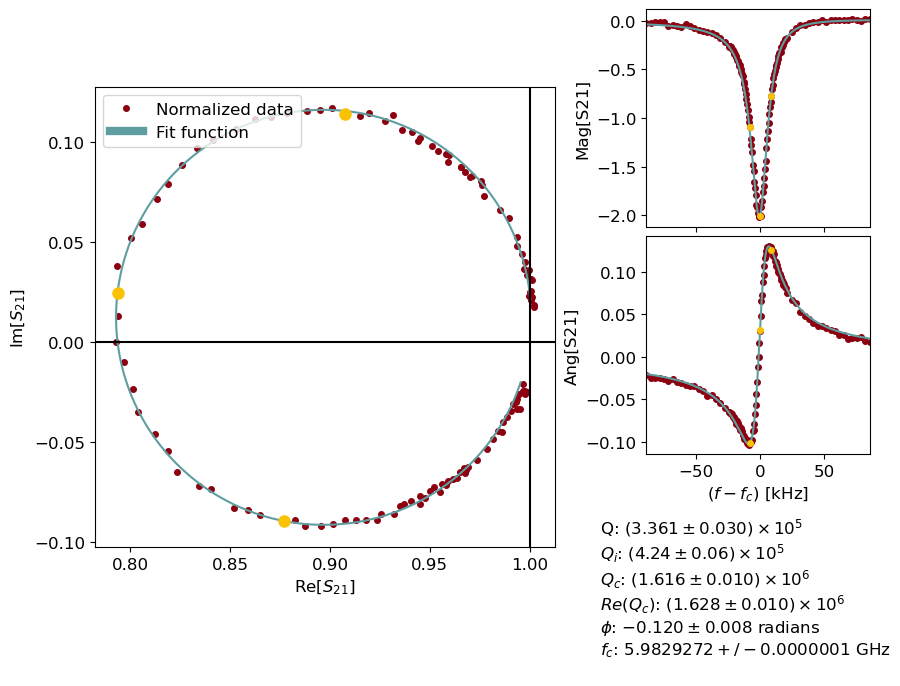

-72.14419939295738


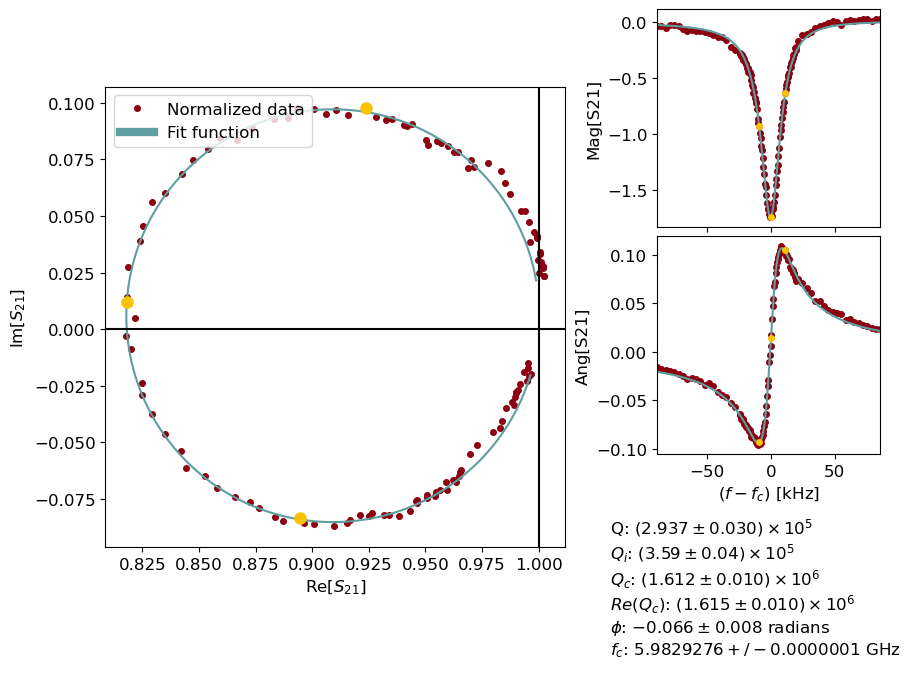

-78.164799306237


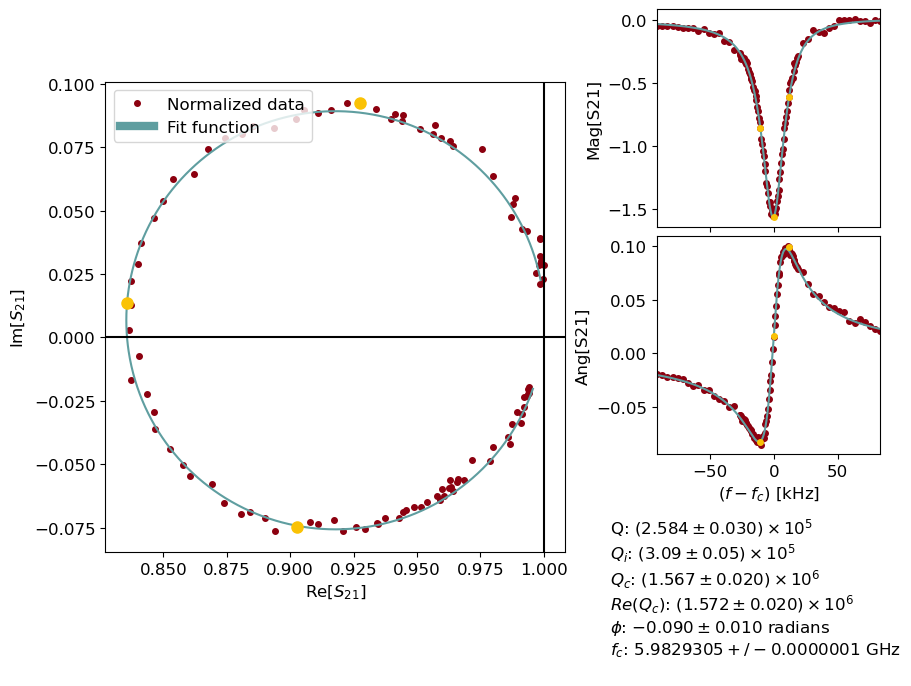

-84.18539921951663


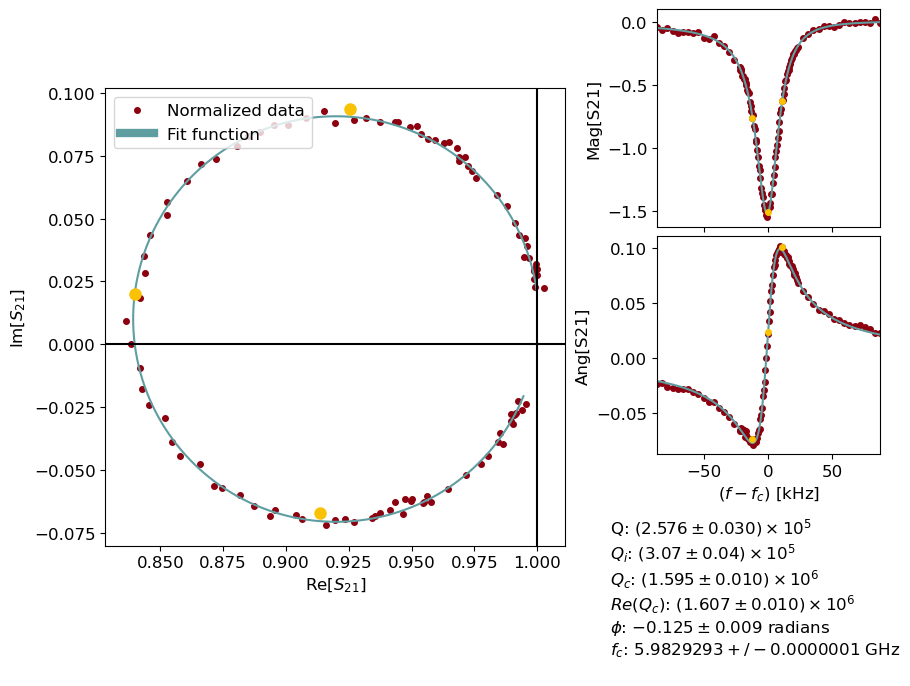

Time elapsed:  8.994642734527588
-30.0


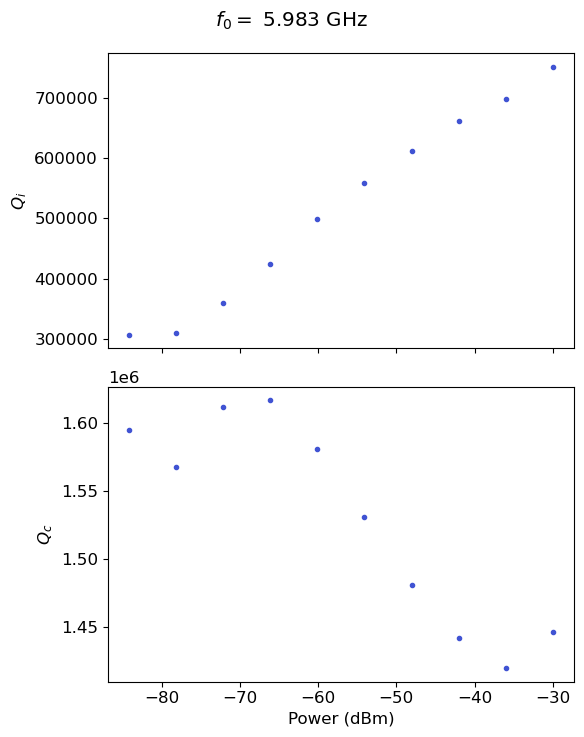

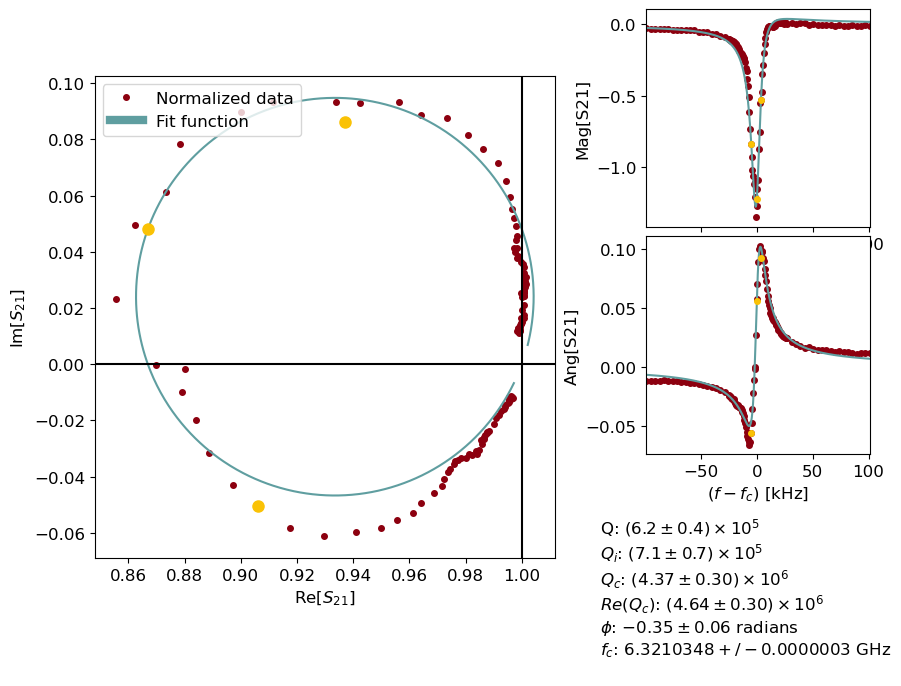

-36.020599913279625


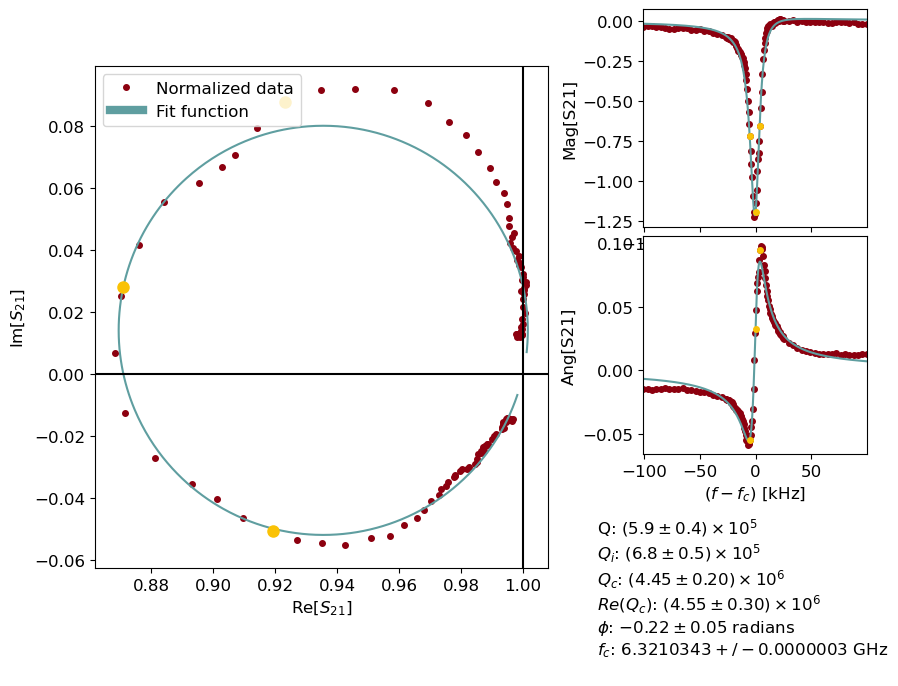

-42.04119982655925


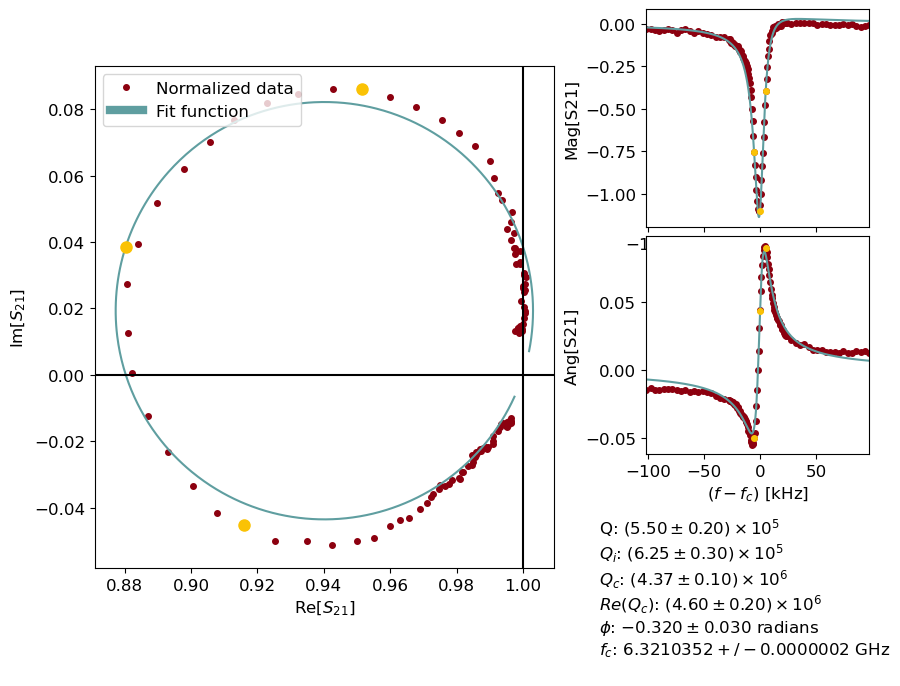

-48.061799739838875


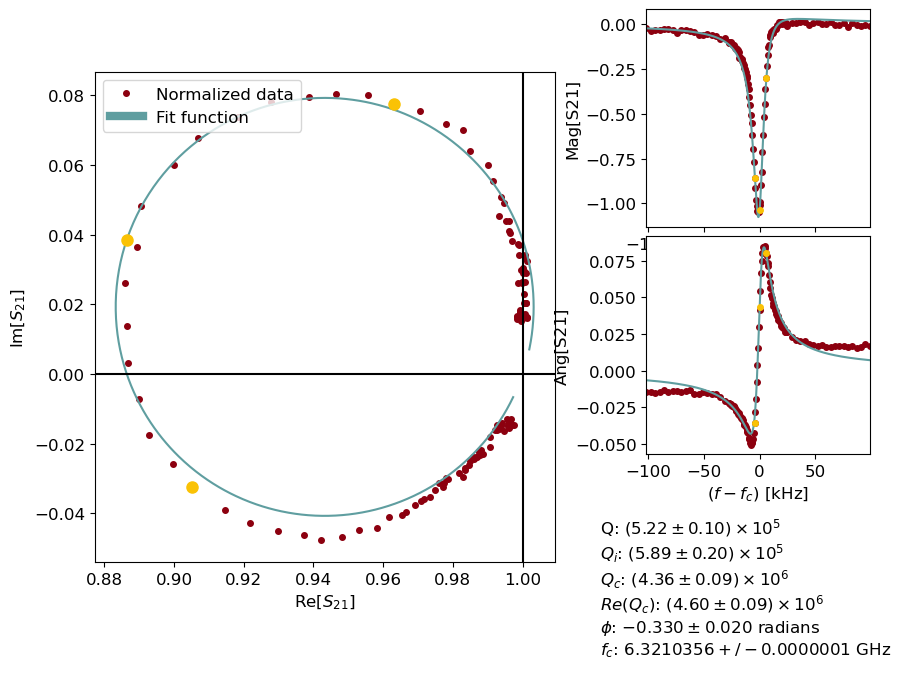

-54.0823996531185


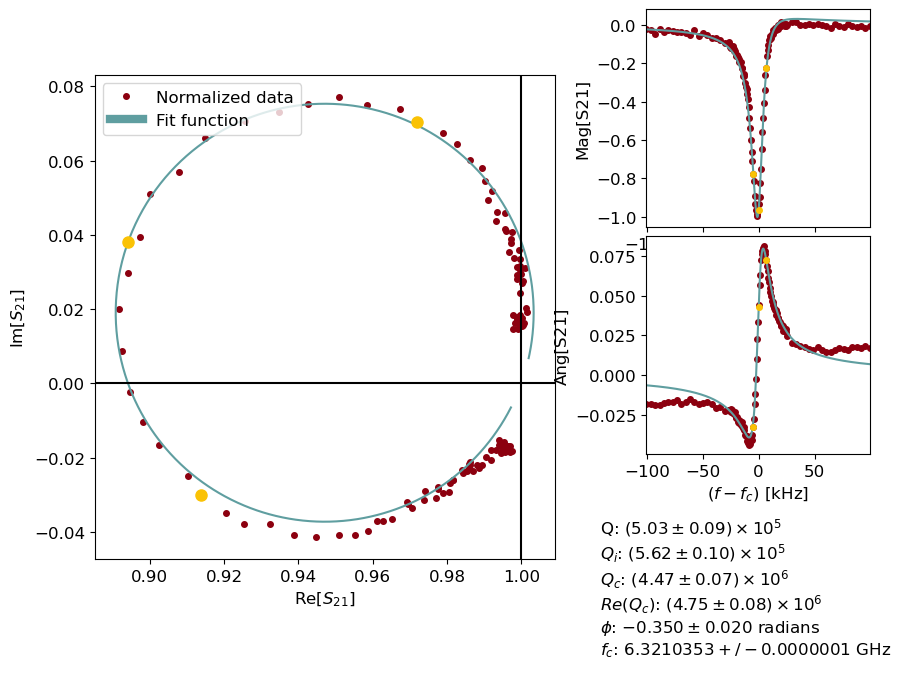

-60.102999566398125


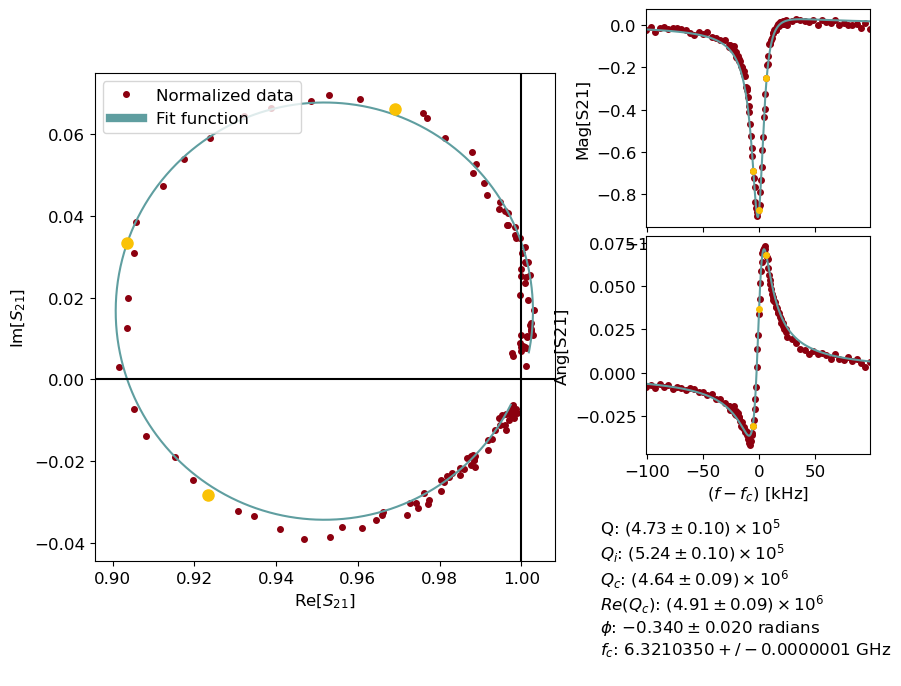

-66.12359947967775


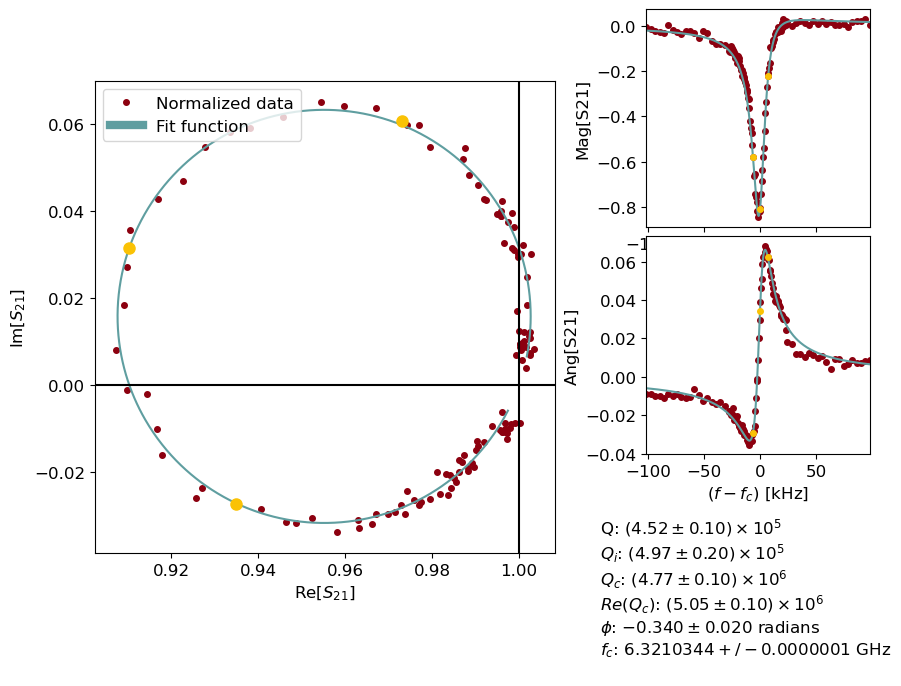

-72.14419939295738


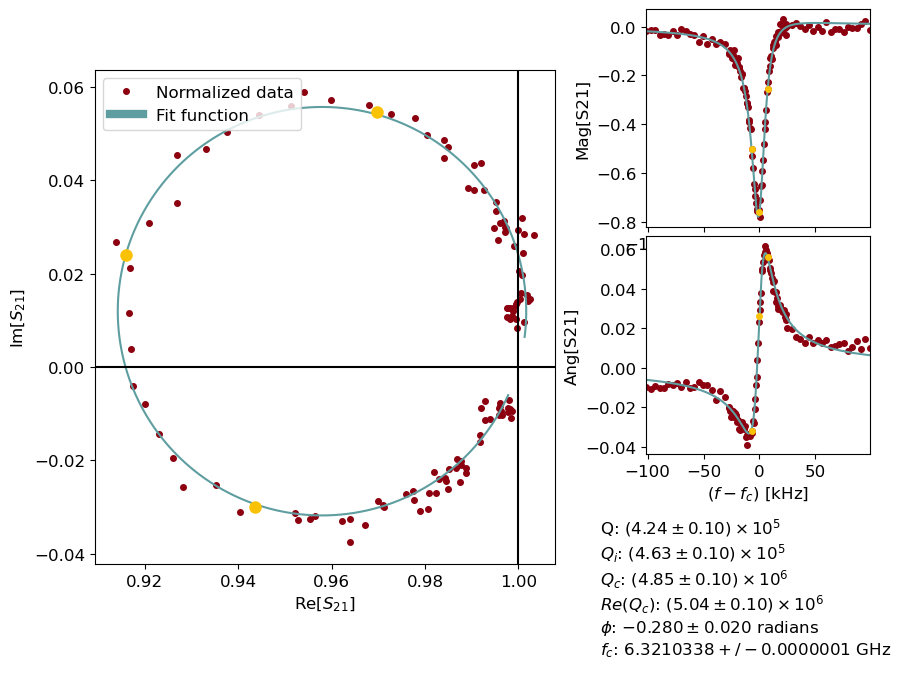

-78.164799306237


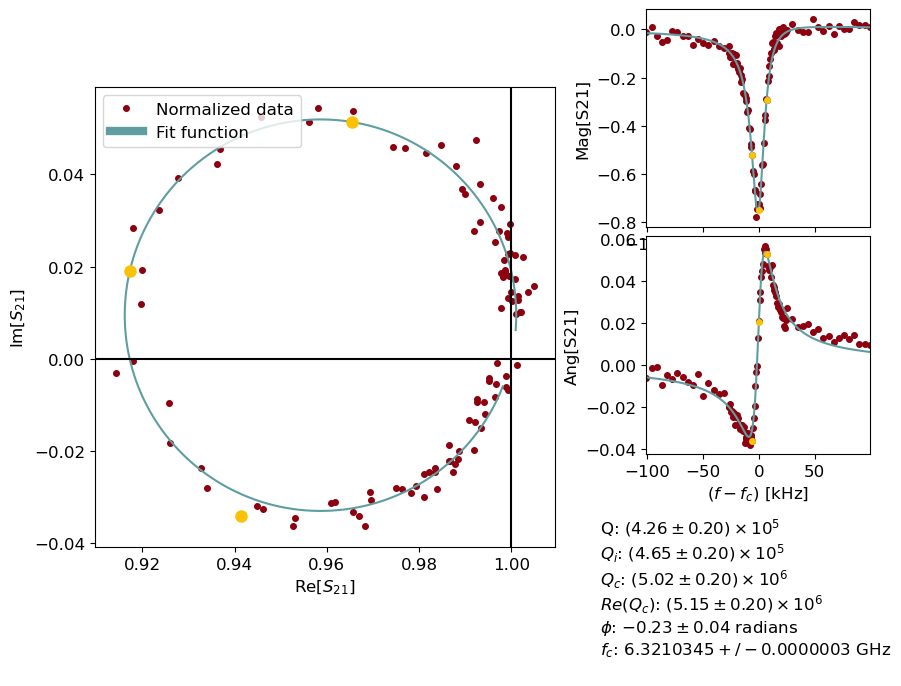

-84.18539921951663


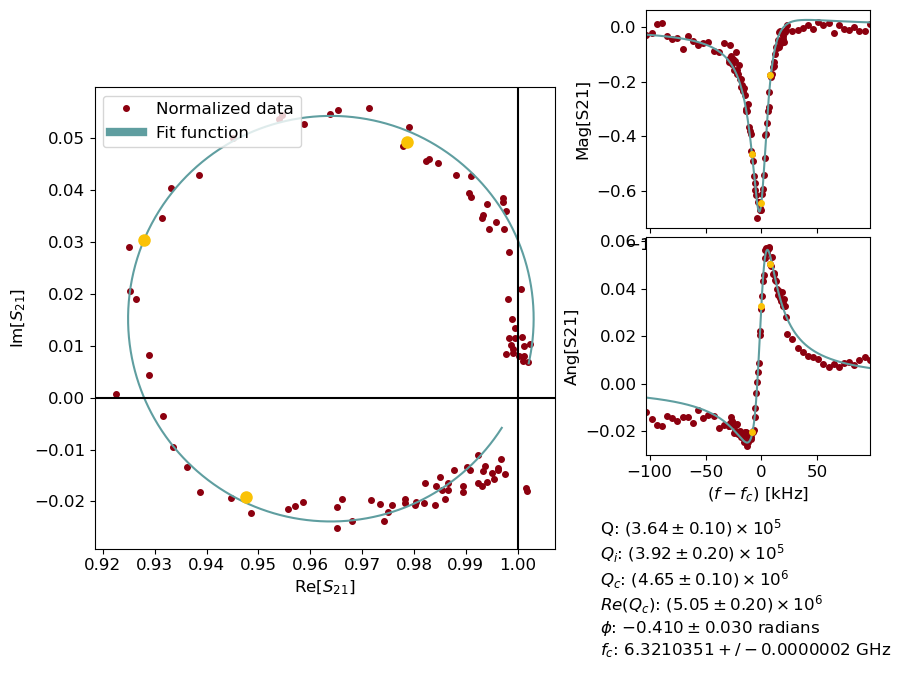

Time elapsed:  18.1600022315979
-30.0


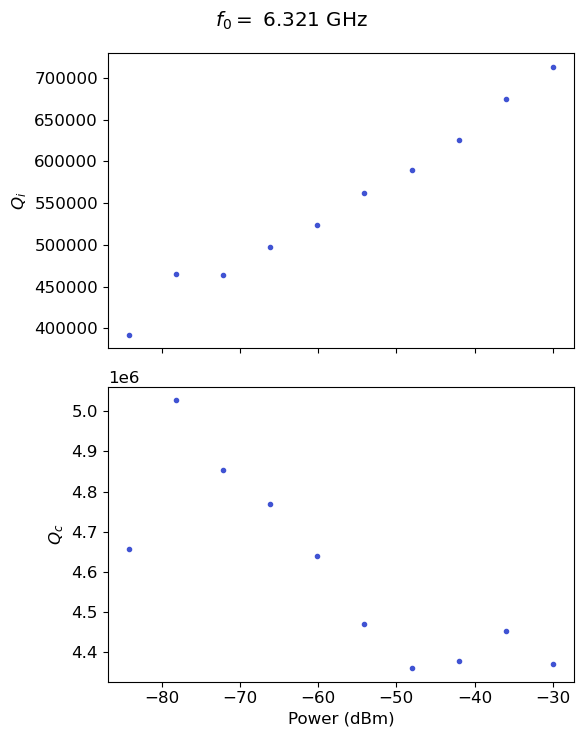

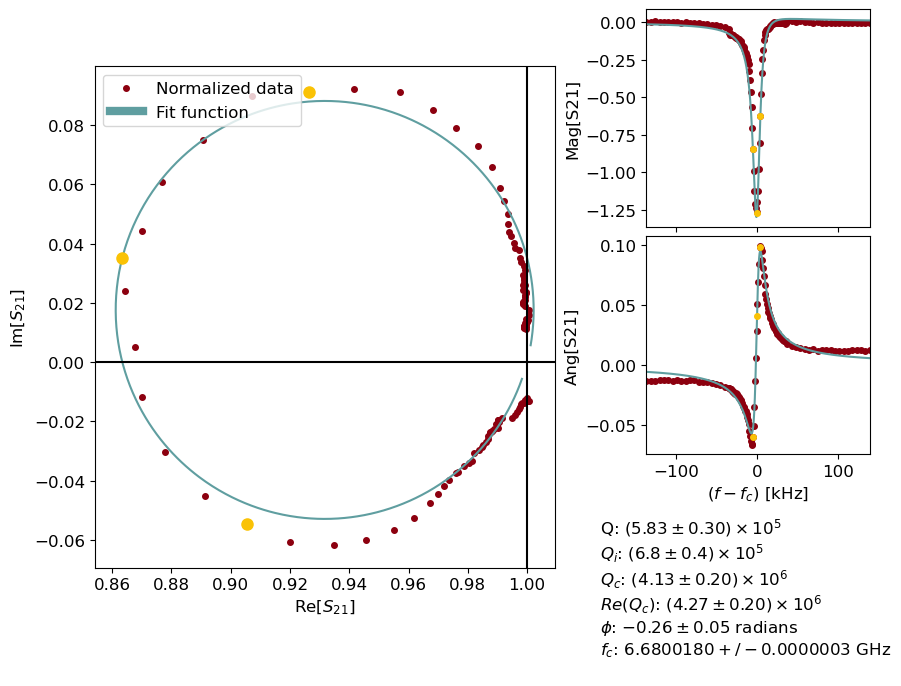

-36.020599913279625


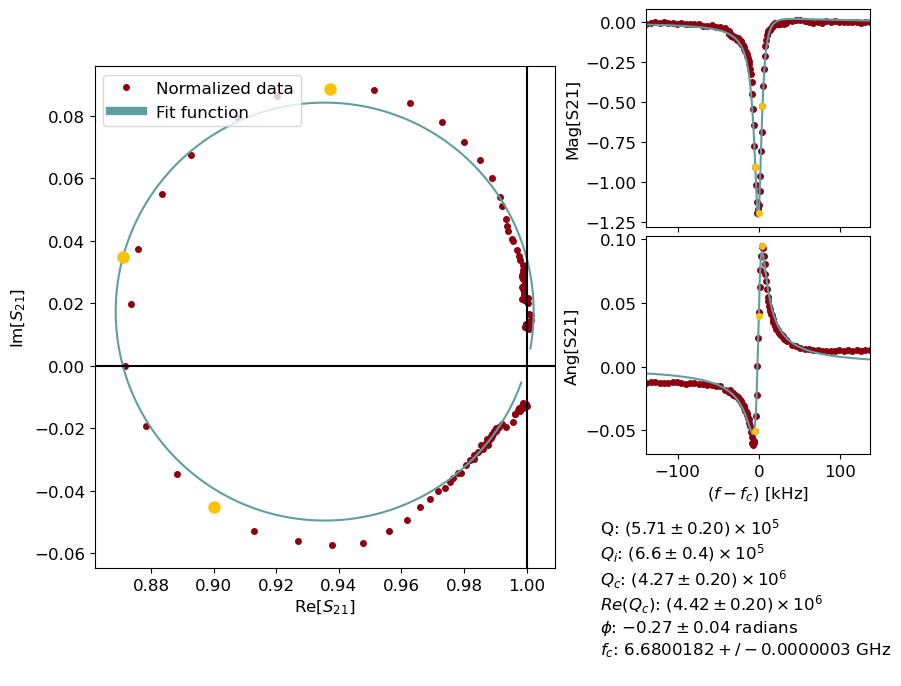

-42.04119982655925


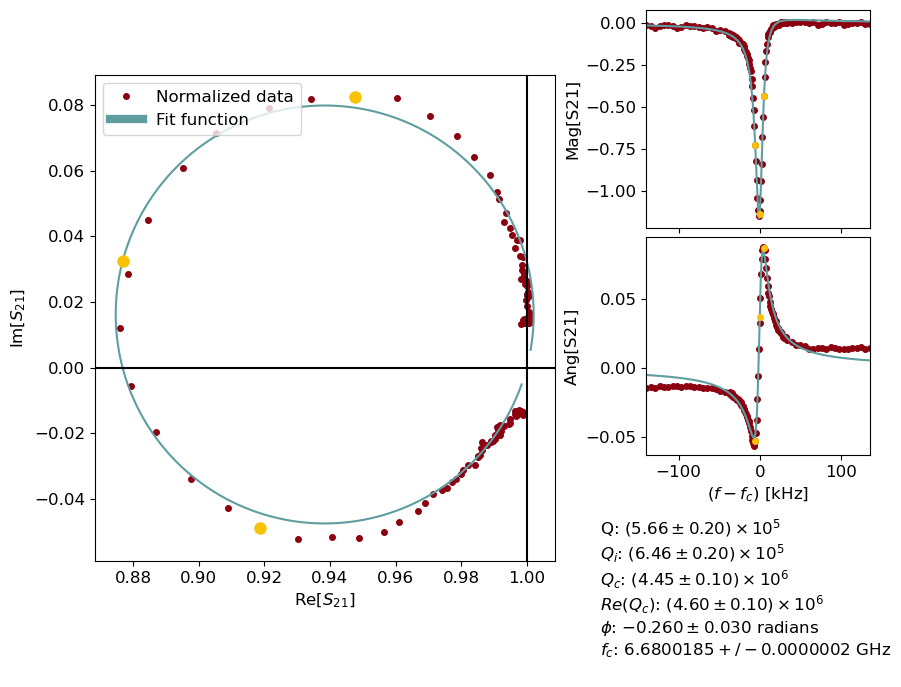

-48.061799739838875


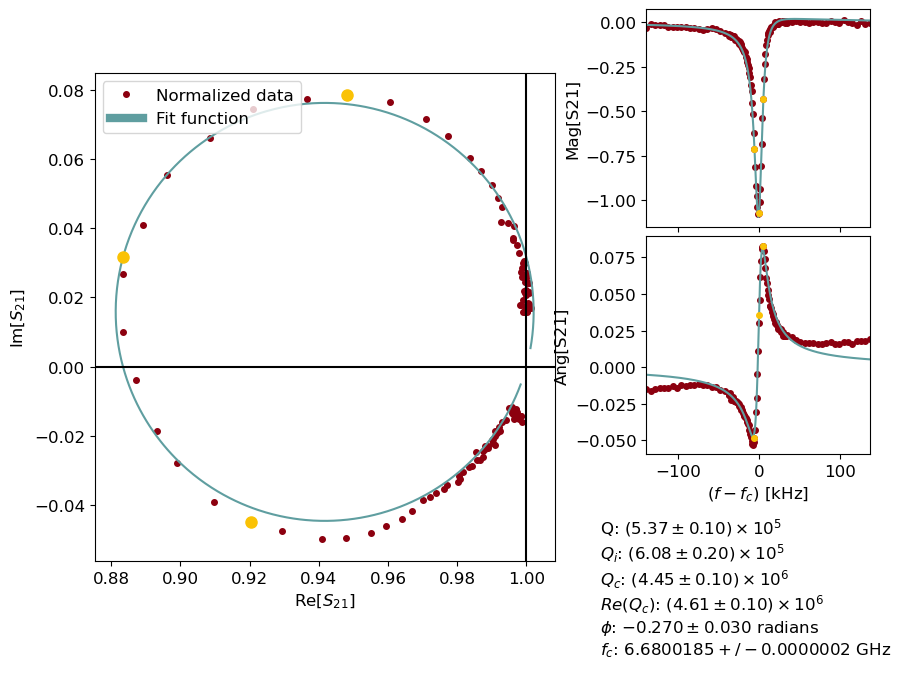

-54.0823996531185


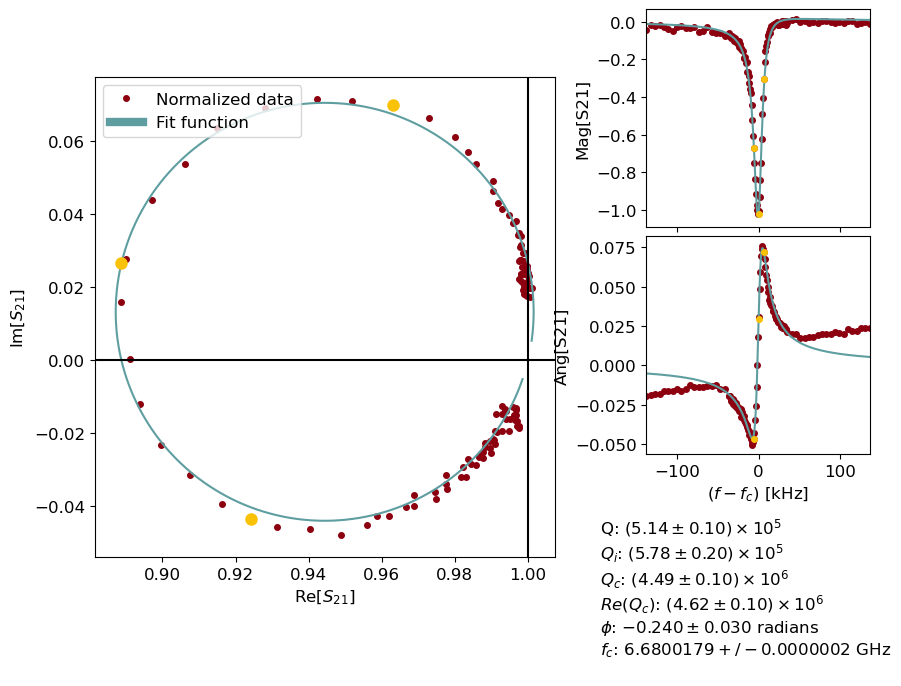

-60.102999566398125


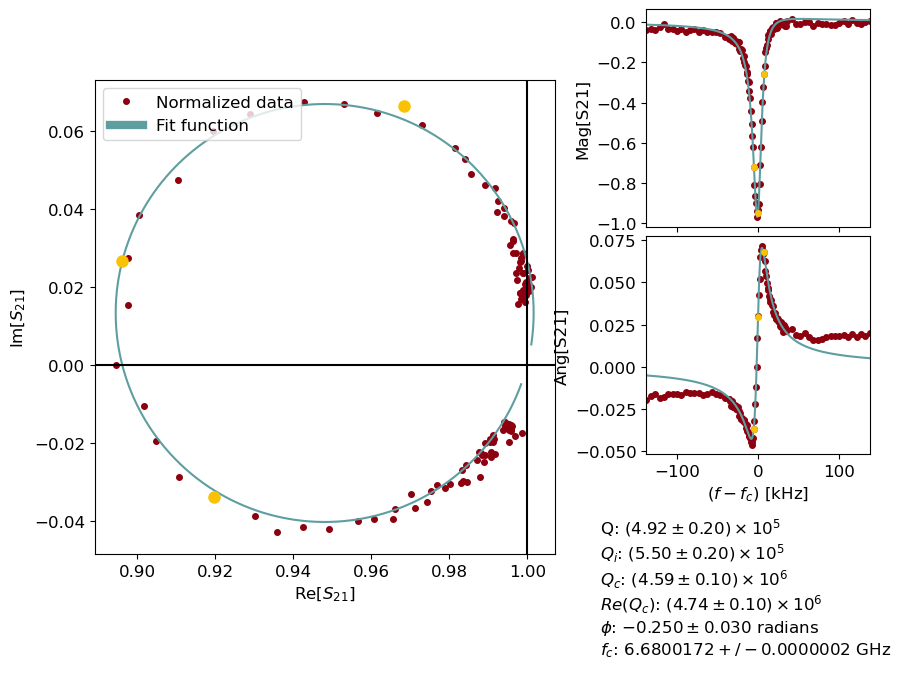

-66.12359947967775


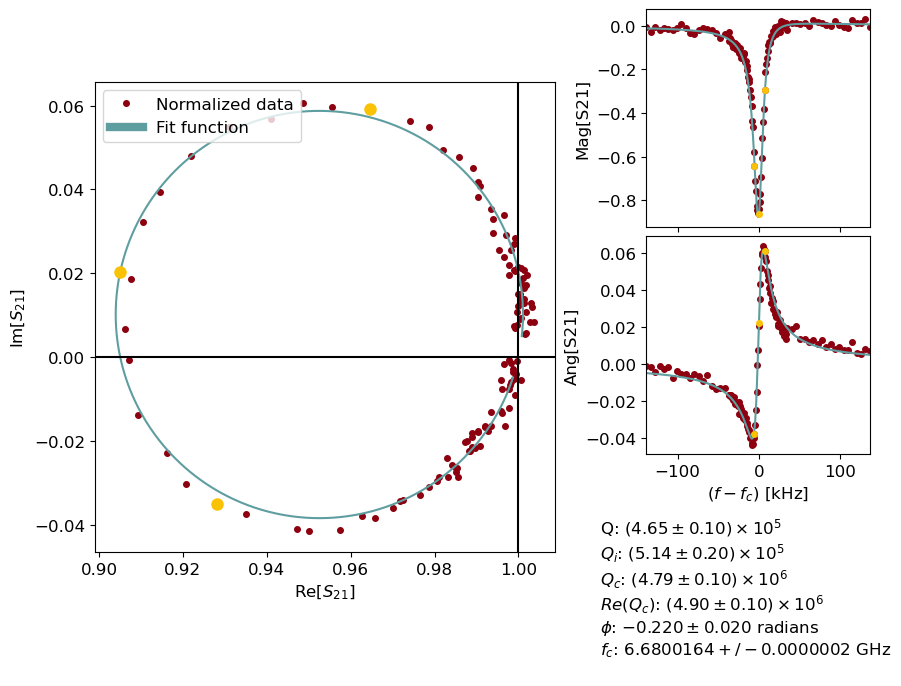

-72.14419939295738


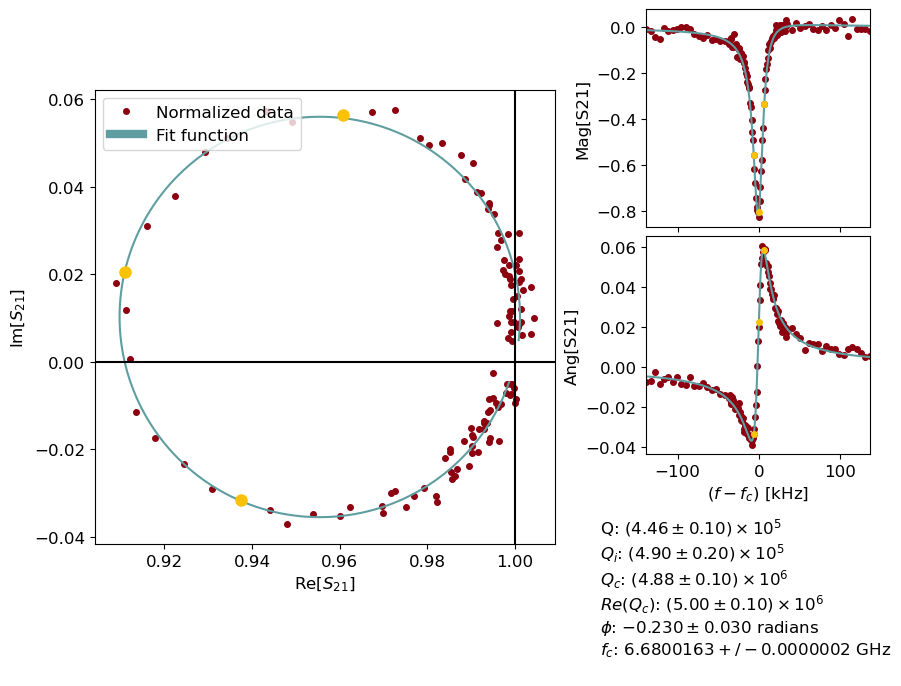

-78.164799306237


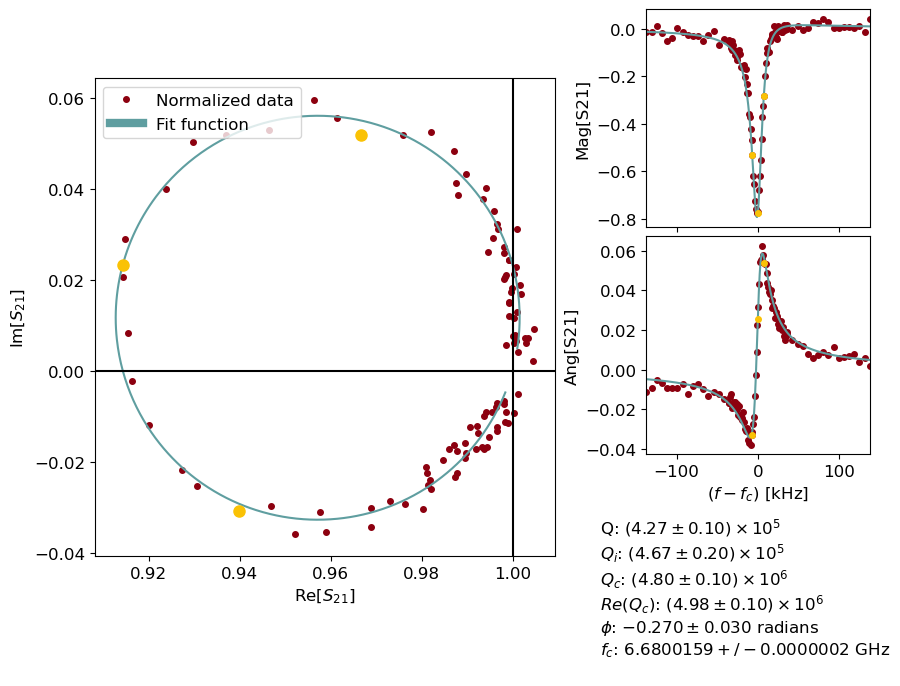

-84.18539921951663


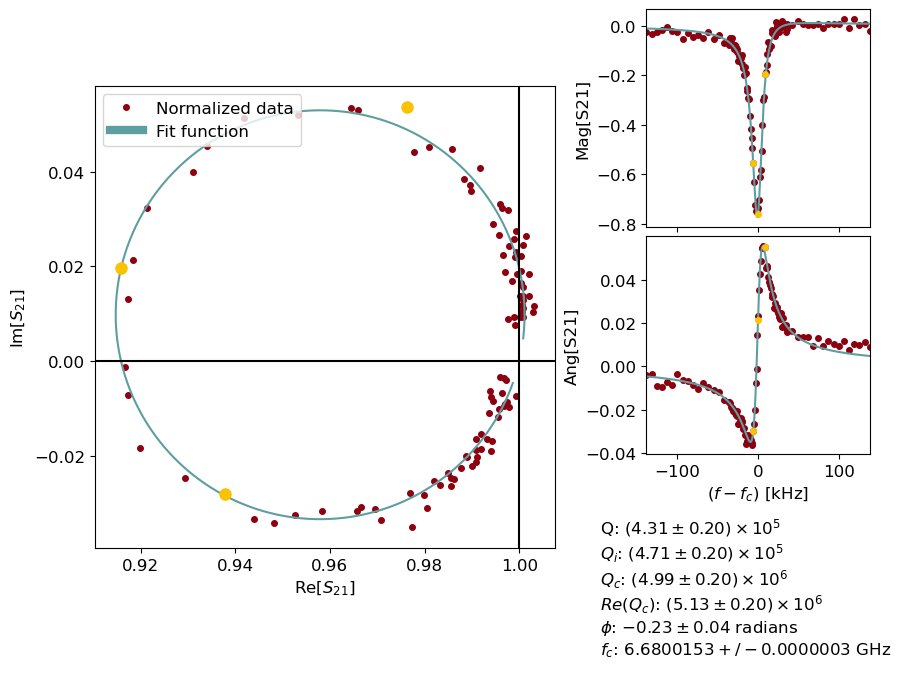

Time elapsed:  27.35058903694153
-30.0


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=6345000.65395092) = 0.9150108937457793 < max(sigmas)
  warn(errmsg)
g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


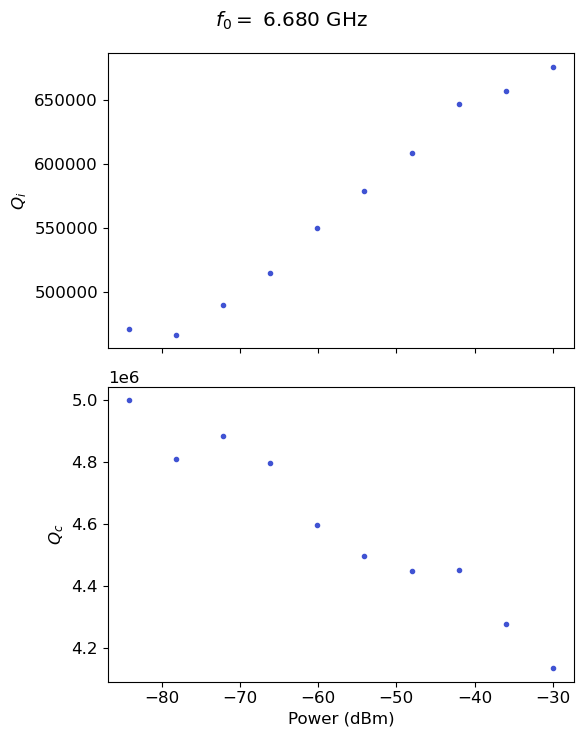

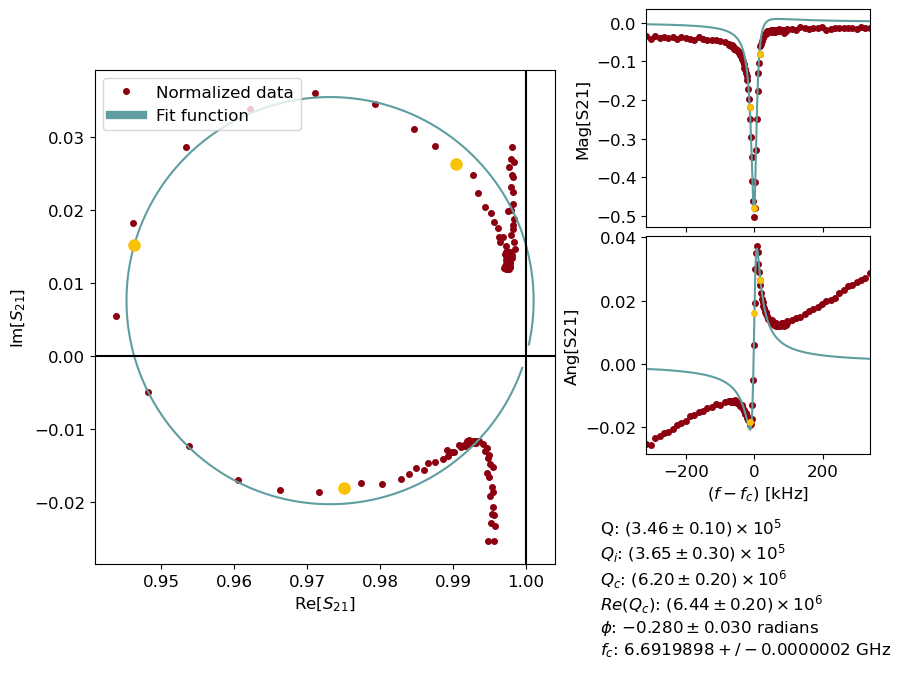

-36.020599913279625


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=275.93255027136706) = 0.8751632060287904 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=14788.670358110458) = 0.9363551789909462 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=44366.01107433137) = 0.0 < max(sigmas)
  warn(errmsg)
g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\fit.py:1014: RuntimeWarning: divide by zero encountered in scalar power
  - (
g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\fit.py:1045: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_neg = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][0][1])


>Error when trying to write parameters on plot
>cannot convert float infinity to integer
-42.04119982655925


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=23992.956269389044) = 0.0 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.7065429566189071 < 1e-05 at iteration 2 and prob(phi=-0.3265685542644944) = 0.14466180071603413 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=-0.7065111755146334 < 1e-05 at iteration 2 and prob(phi=-0.13995795182764048) = 0.14467239657693506 < max(sigmas)
  warn(errmsg)


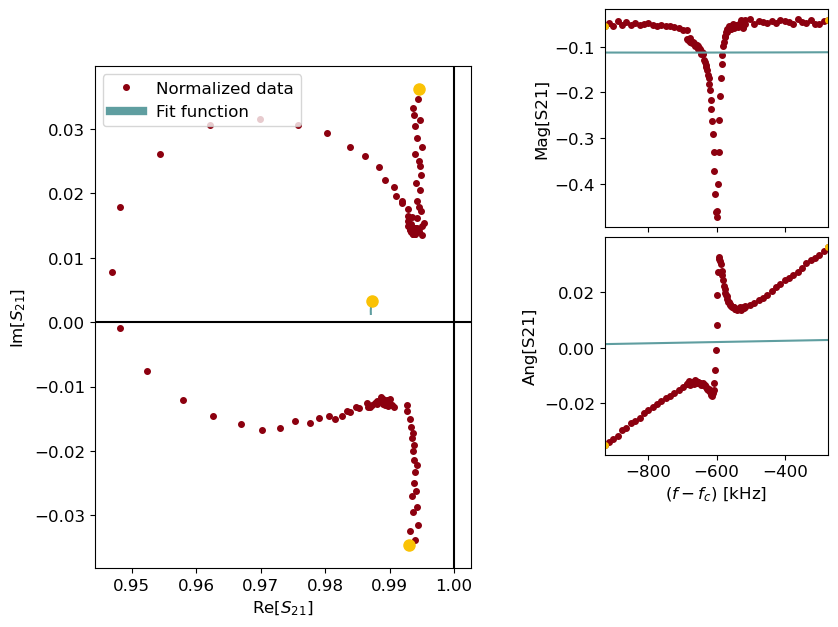

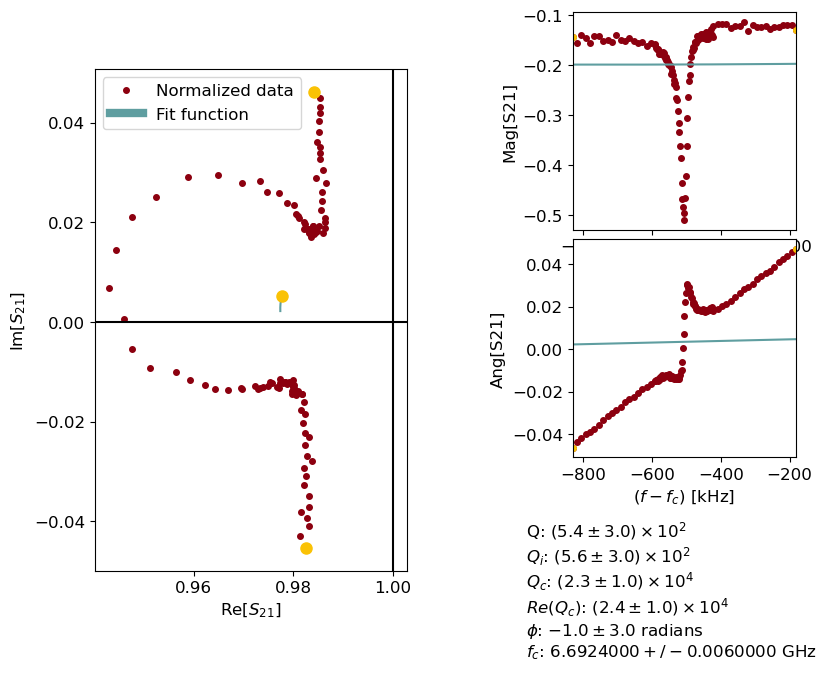

-48.061799739838875
Less than 5 Data points to fit data, not enough points near resonance, attempting to fit anyway


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=23476.450762435536) = 0.0 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Q=156509.67174957023) = 0.05359213756854676 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=3530.927914845059) = 0.4075377298307383 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=10592.783744535178) = 0.0 < max(sigmas)
  warn(errmsg)
g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\fit.py:1022: RuntimeWarning: divide by zero encountered in scalar power
  - (


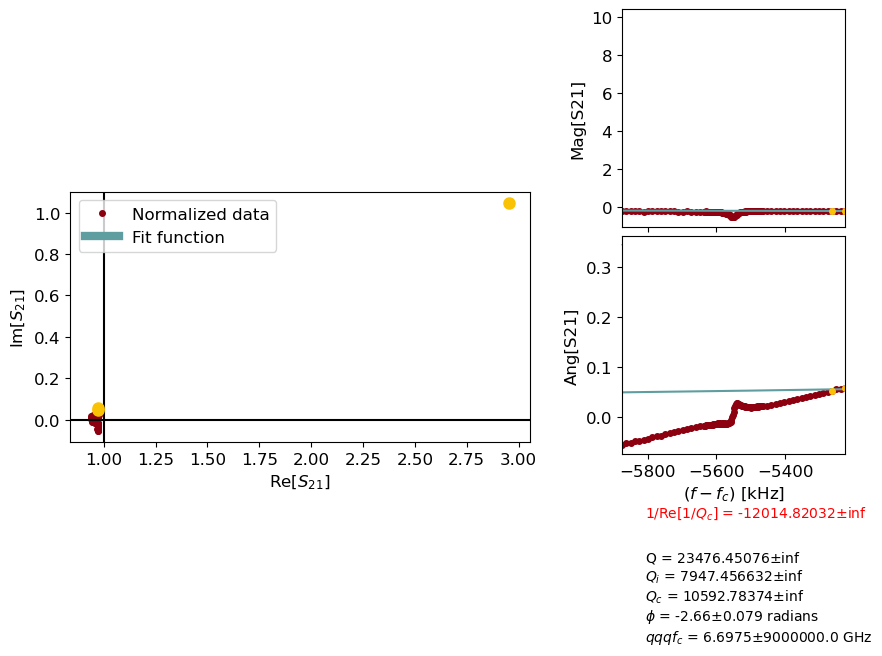

-54.0823996531185


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=36.77731553201573) = 0.3067626592135957 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=110.33194659604717) = 0.0 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(w1=6023080706.863403) = 0.3026599142945978 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(w1=7361543086.166383) = 0.30119433622544906 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:369: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(phi=0.02095047119927964) = 0.0 < max(sigmas)
  warn(errmsg)
c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confiden

>Error when trying to write parameters on plot
>cannot convert float infinity to integer
-60.102999566398125


attempt to get argmin of an empty sequence
>Failed to find initial guess for method DCM.  Please manually initialize a guess
An exception occurred: cannot access local variable 'init_guess' where it is not associated with a value
-66.12359947967775
Less than 5 Data points to fit data, not enough points near resonance, attempting to fit anyway
Improper input: func input vector length N=3 must not exceed func output vector length M=2
>Failed to find confidence intervals for least squares fit


Qi is less than zero. Please make sure data is of correct format: decibals (log10*20 version), and radians. Otherwise, it is quite likely that the resonator being fit is not a Notch type resonator. Other types of resonators will not work with this code.
>Error when trying to write parameters on plot
>cannot convert float infinity to integer
-72.14419939295738


Traceback (most recent call last):
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 373, in analyze_sweep_gen
    data, attrs = load_resonator(
                  ^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 694, in load_resonator
    data3, _ = grab_data(pth, file3, meas_type, slope)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 141, in grab_data
    data, attrs = hy.prev_data(pth, fname)
                  ^^^^^^^^^^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\meas_analysis\handy.py", line 12, in prev_data
    with SlabFile(temp_data_file) as a:
         ^^^^^^^^^^^^^^^^^^^^^

attempt to get argmin of an empty sequence
>Failed to find initial guess for method DCM.  Please manually initialize a guess
An exception occurred: cannot access local variable 'init_guess' where it is not associated with a value
-78.164799306237
attempt to get argmin of an empty sequence
>Failed to find initial guess for method DCM.  Please manually initialize a guess
An exception occurred: cannot access local variable 'init_guess' where it is not associated with a value
Time elapsed:  46.38995838165283
-30.0


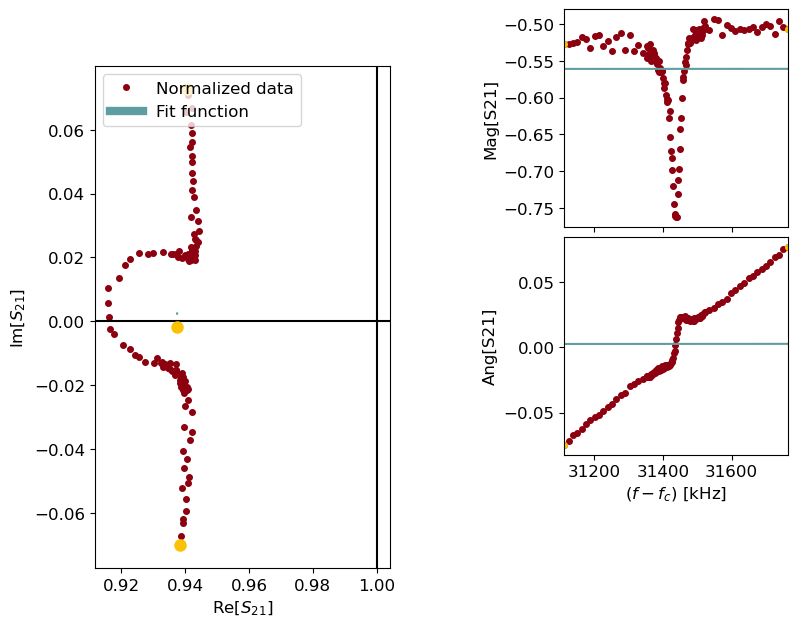

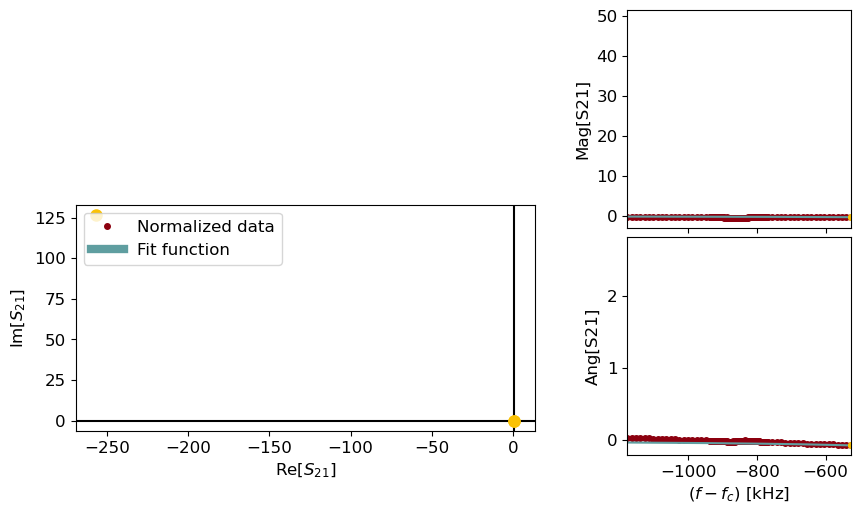

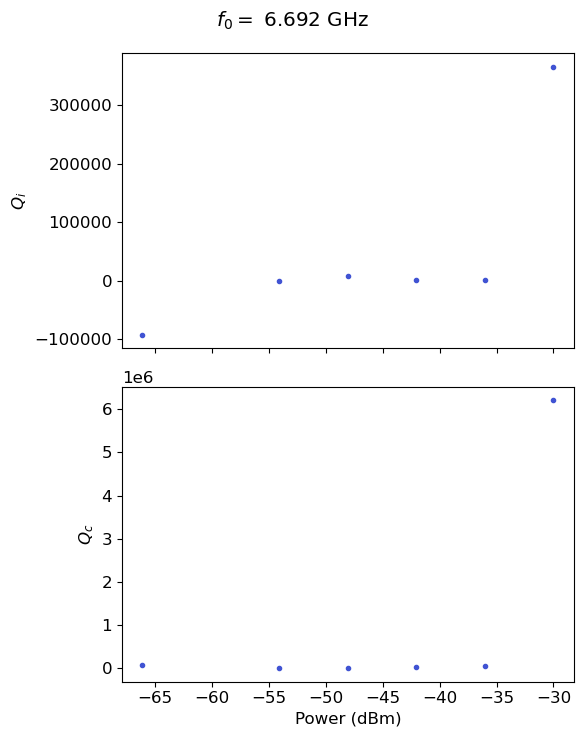

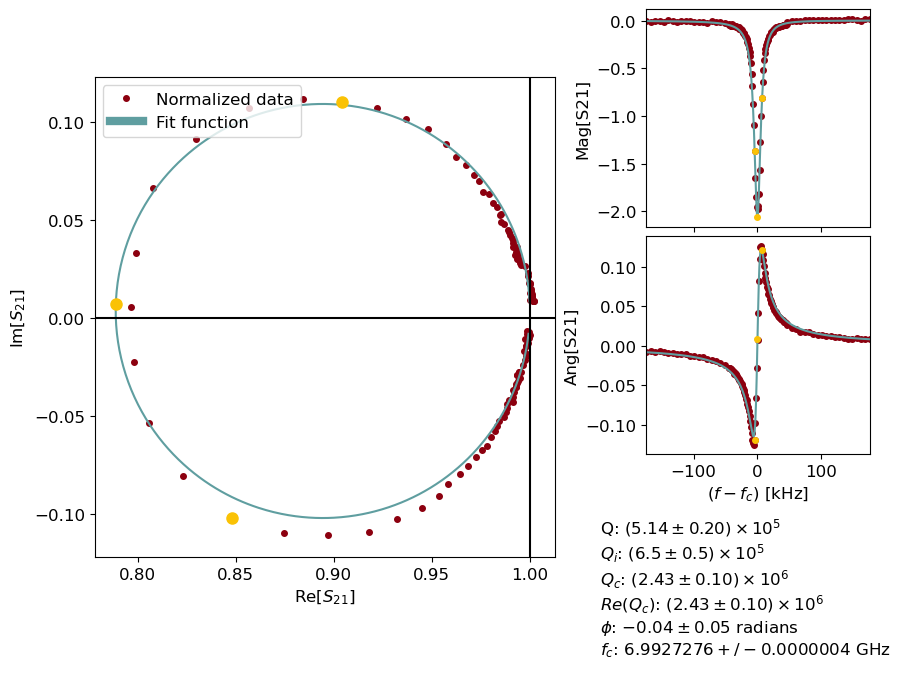

-36.020599913279625


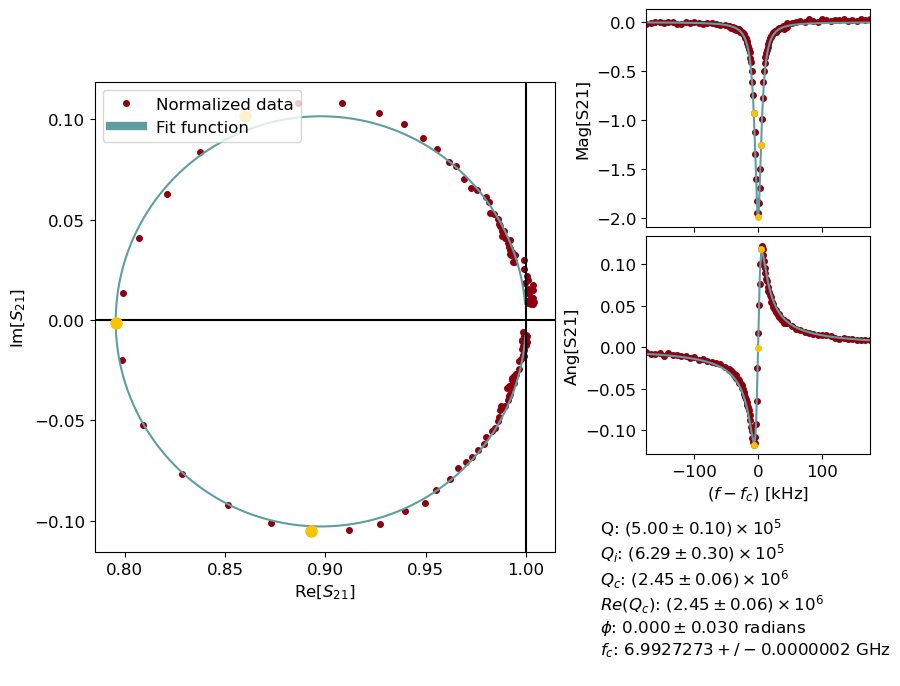

-42.04119982655925


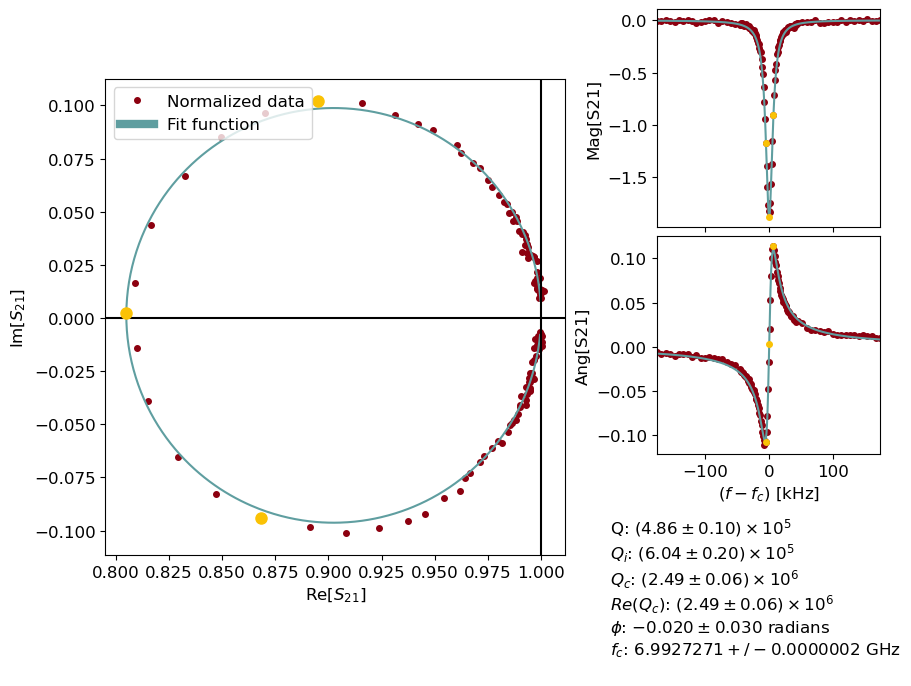

-48.061799739838875


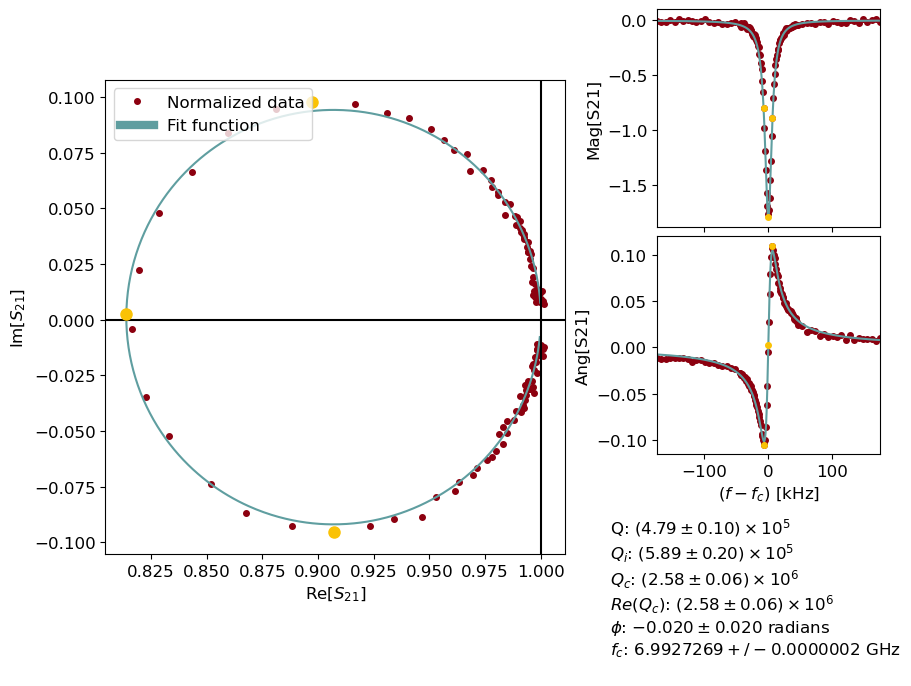

-54.0823996531185


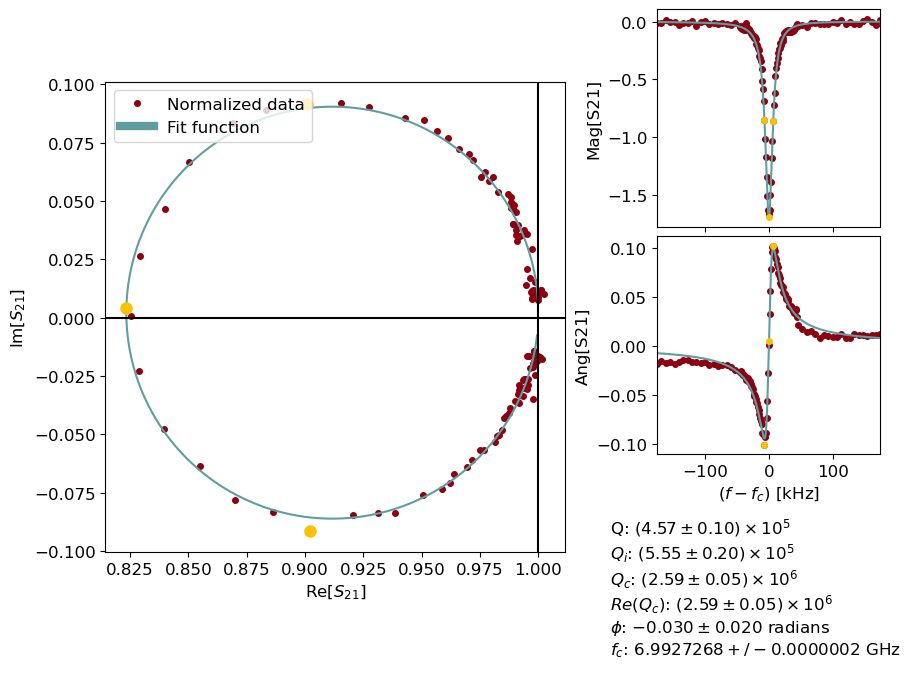

-60.102999566398125


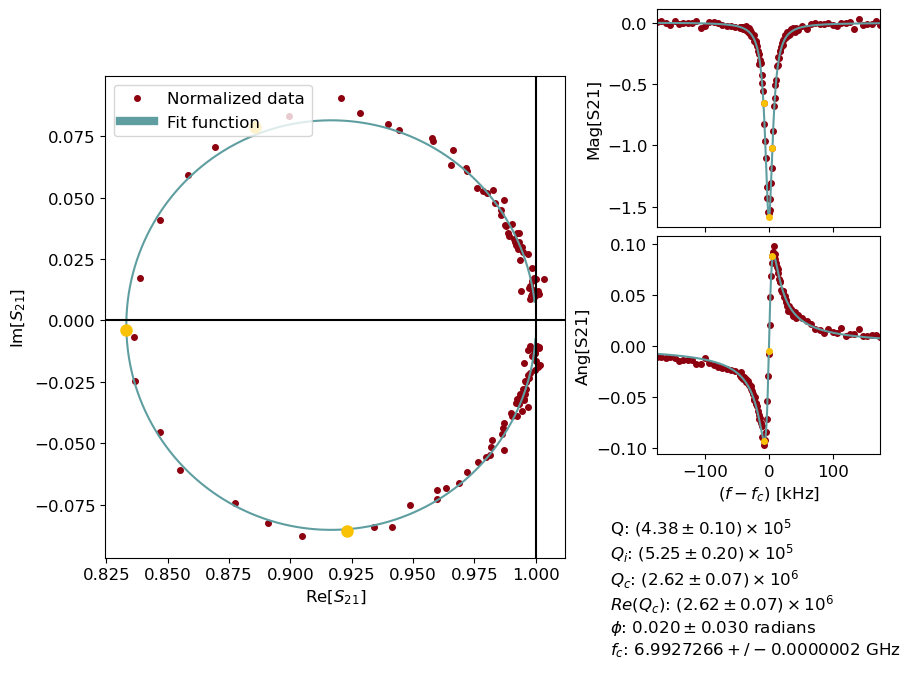

-66.12359947967775


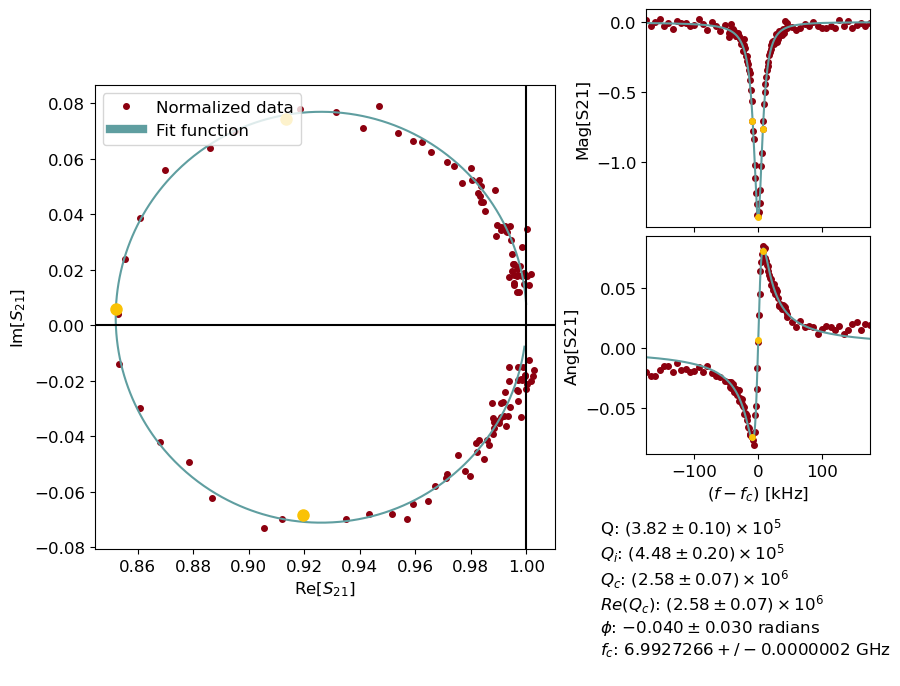

-72.14419939295738


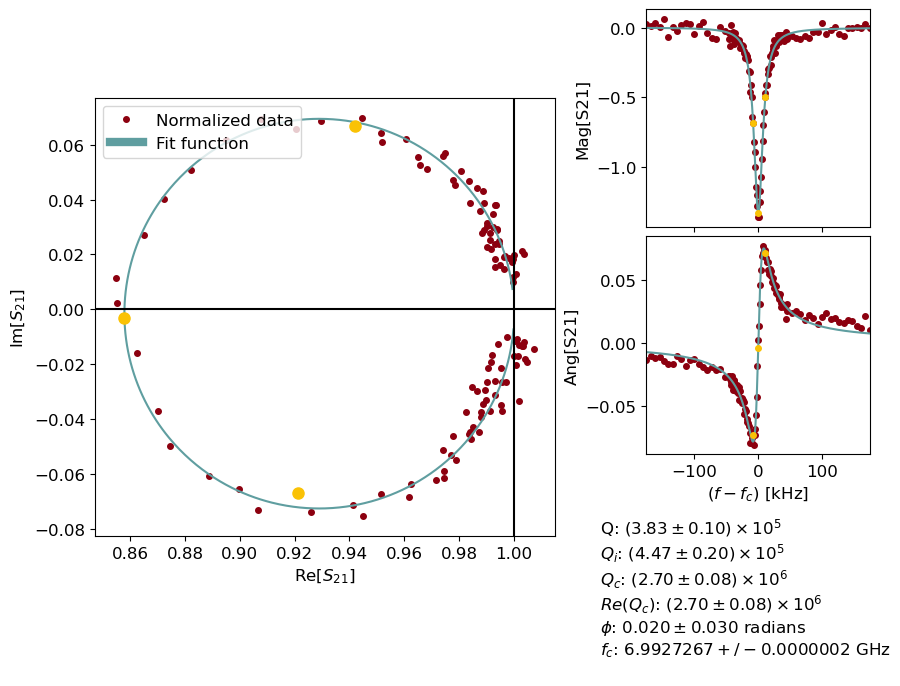

-78.164799306237


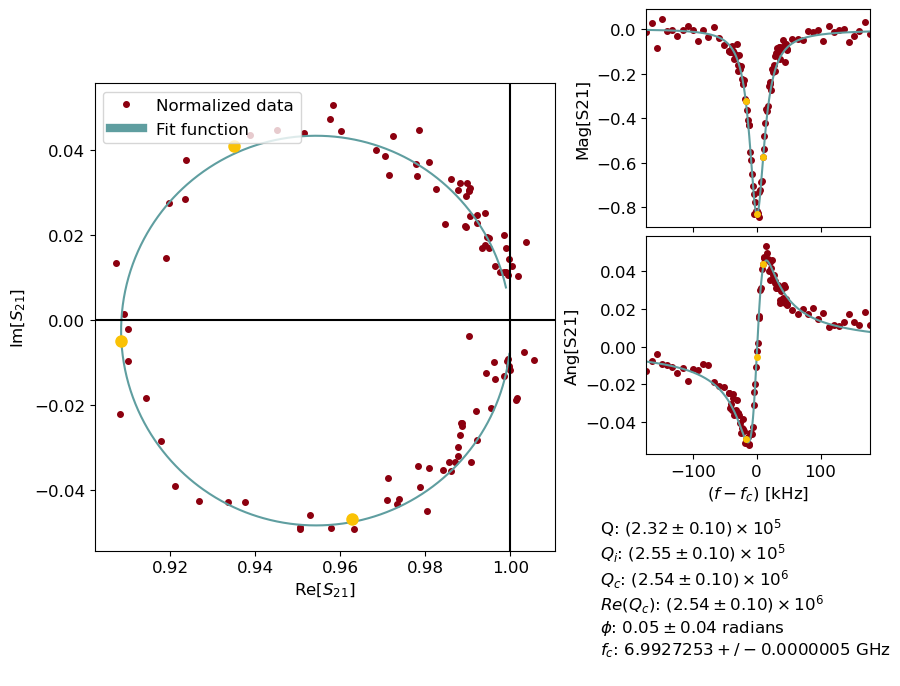

Time elapsed:  55.440903663635254
-30.0


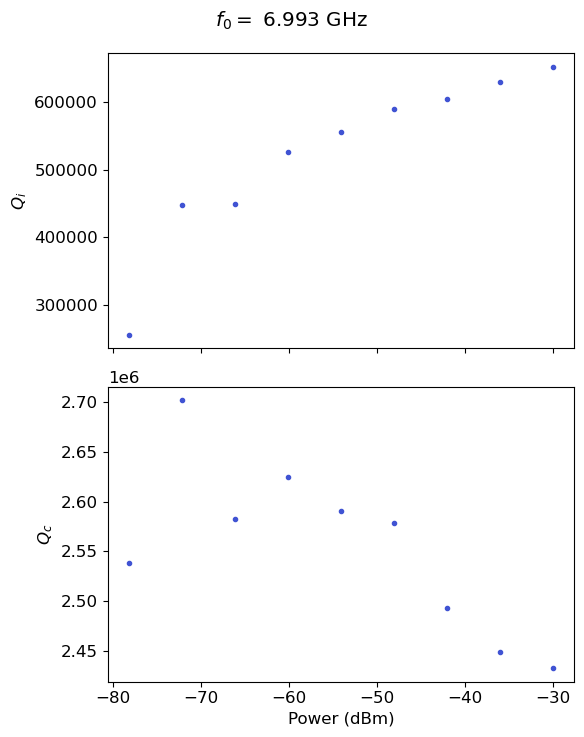

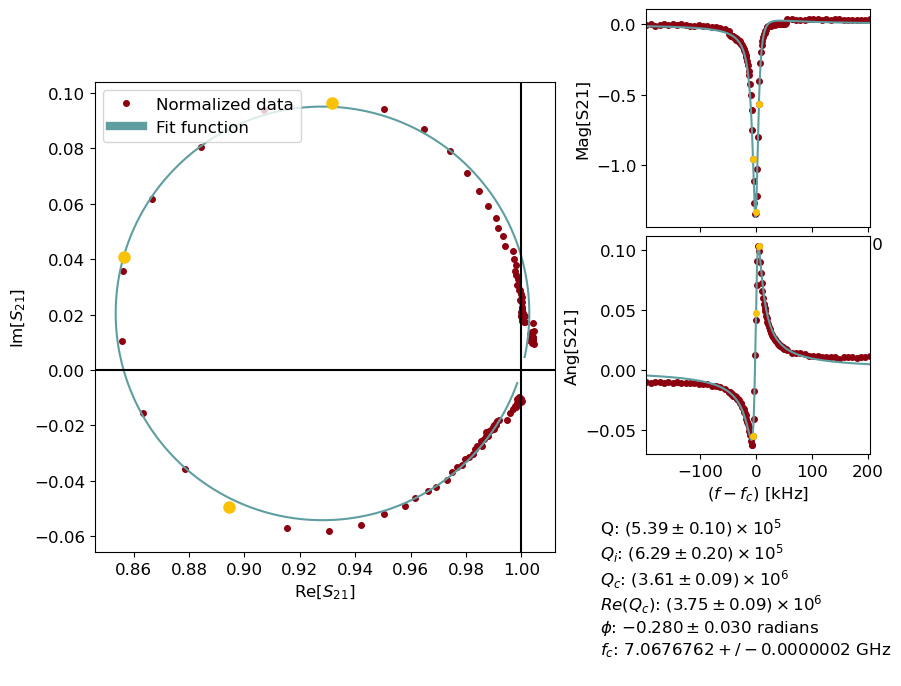

-36.020599913279625


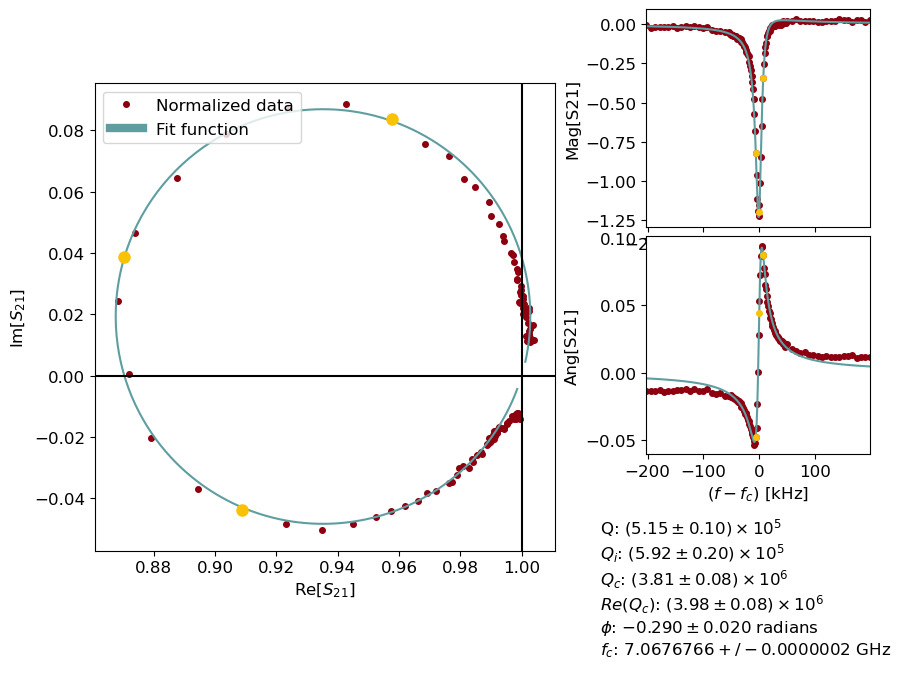

-42.04119982655925


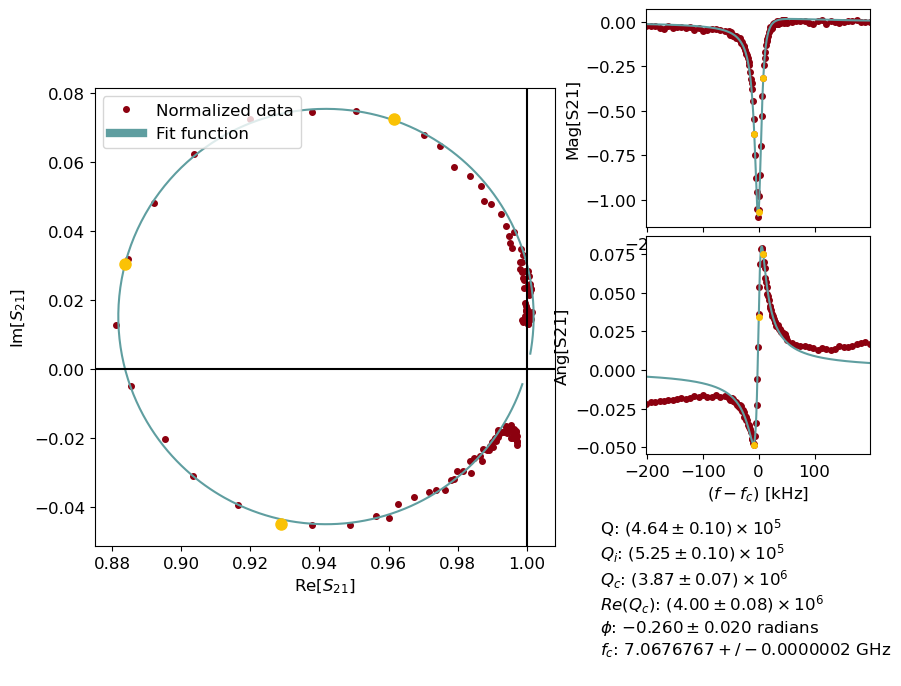

-48.061799739838875


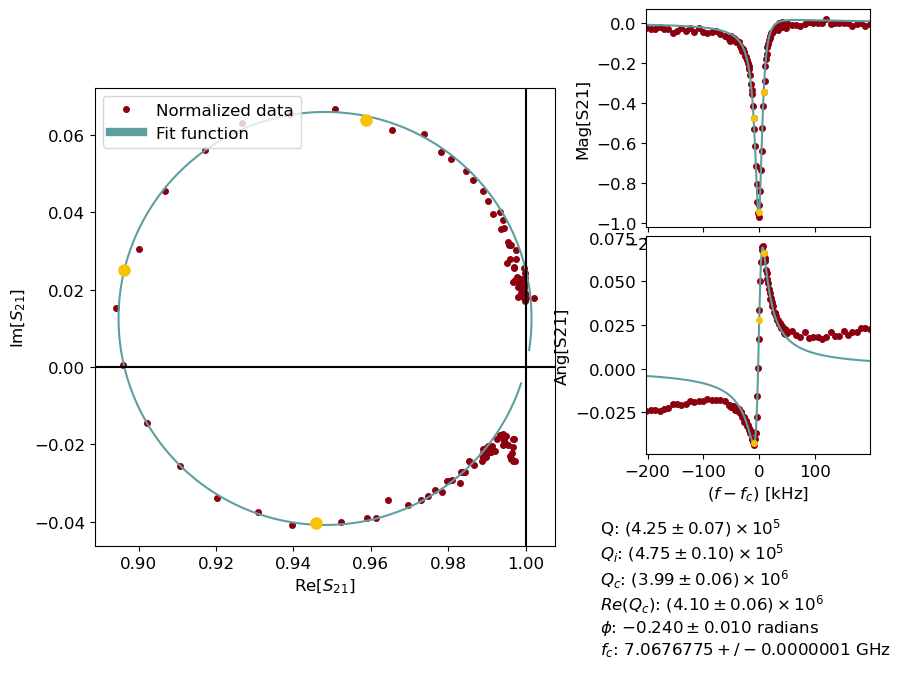

-54.0823996531185


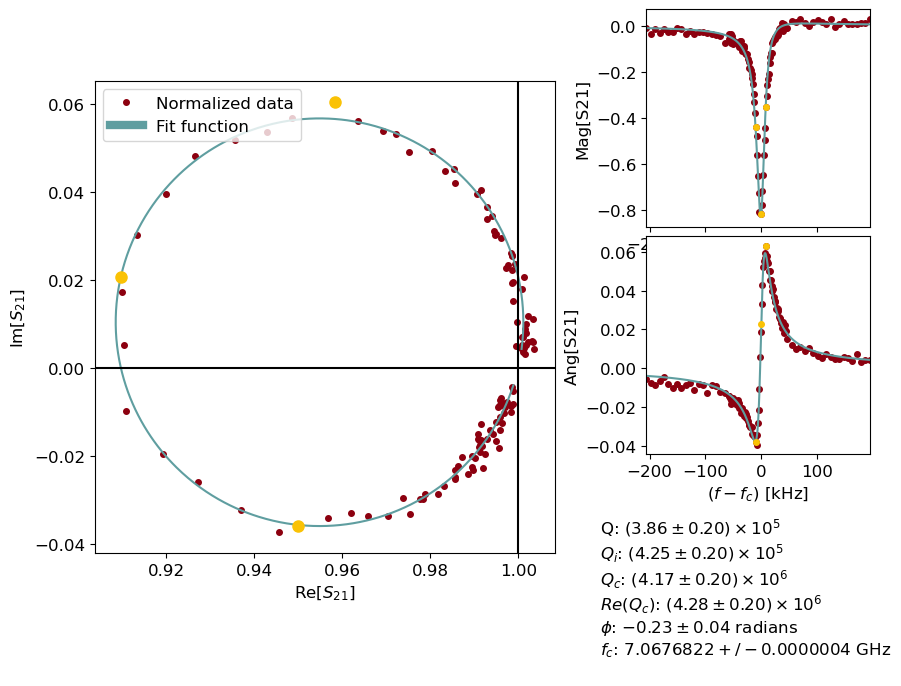

-60.102999566398125


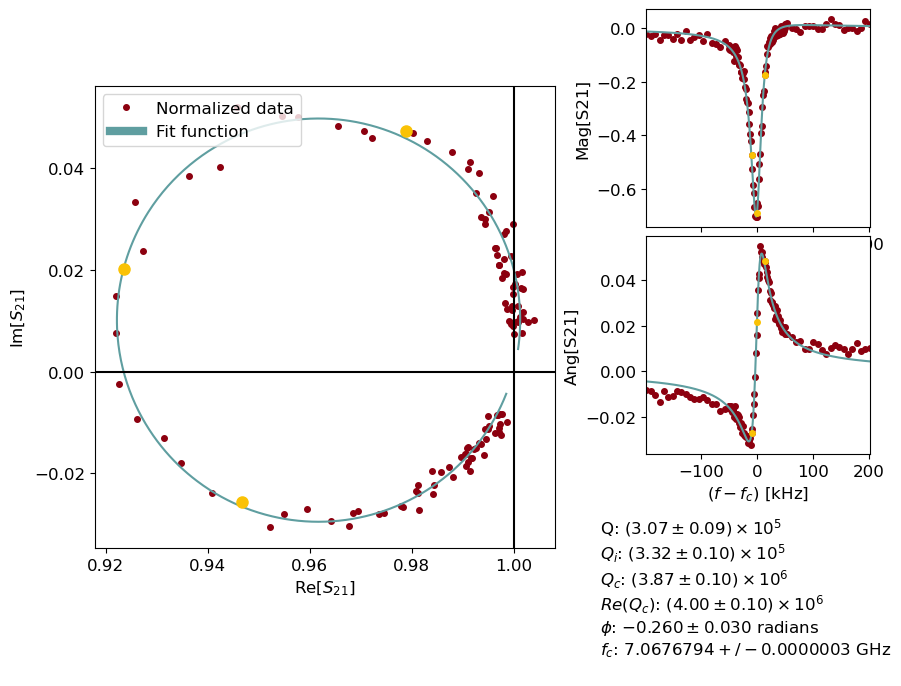

-66.12359947967775


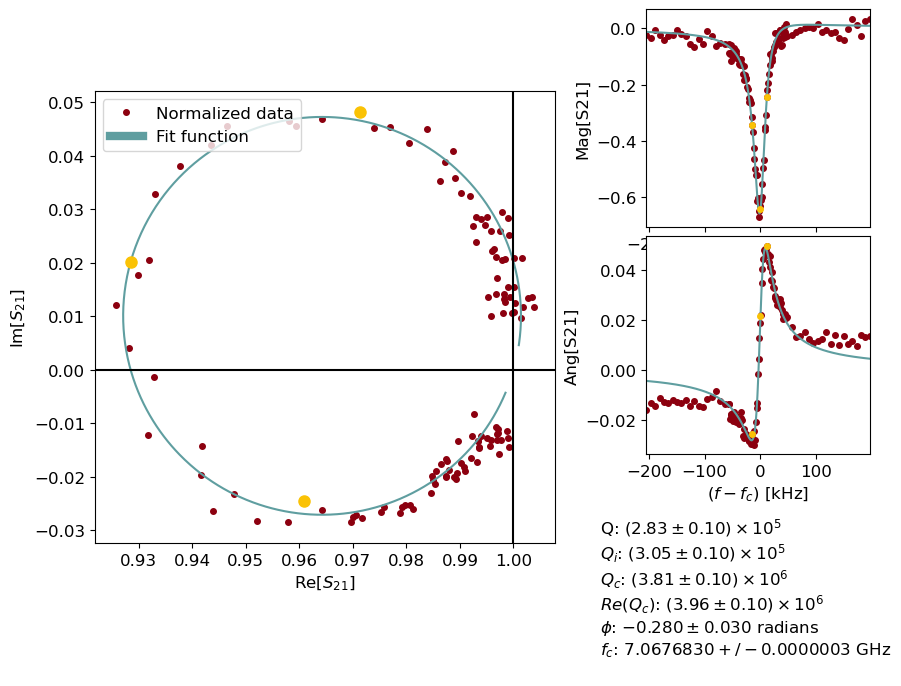

-72.14419939295738


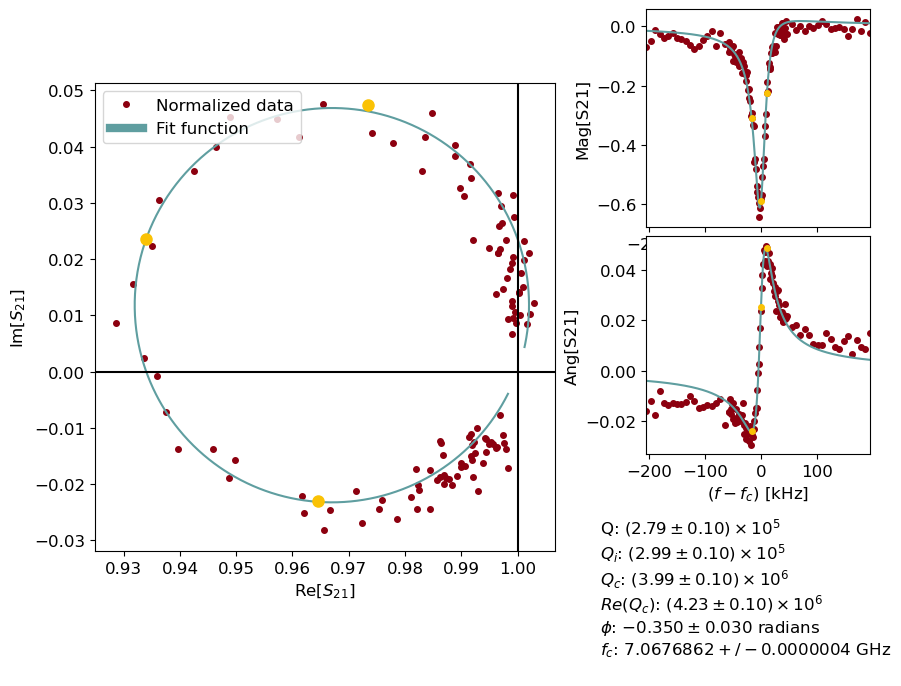

-78.164799306237


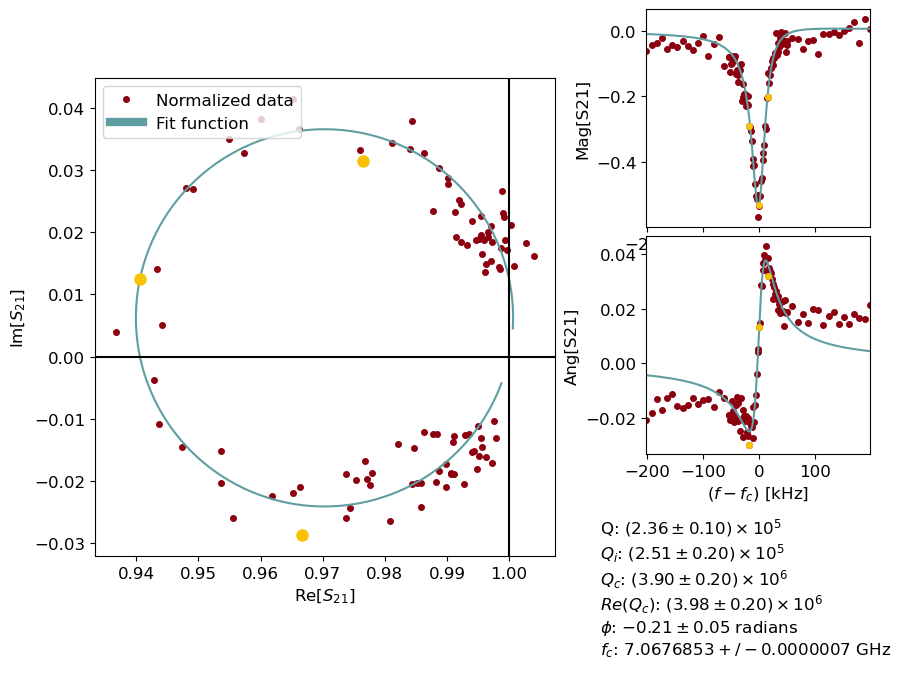

Time elapsed:  64.02421808242798
-30.0


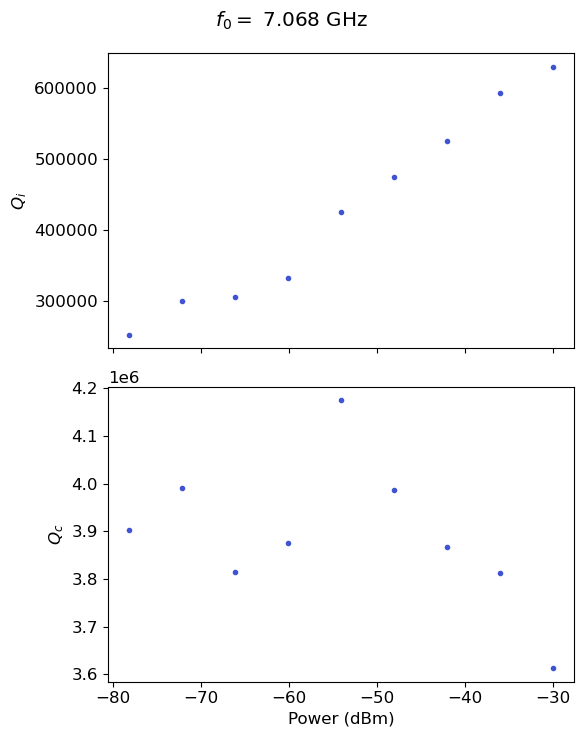

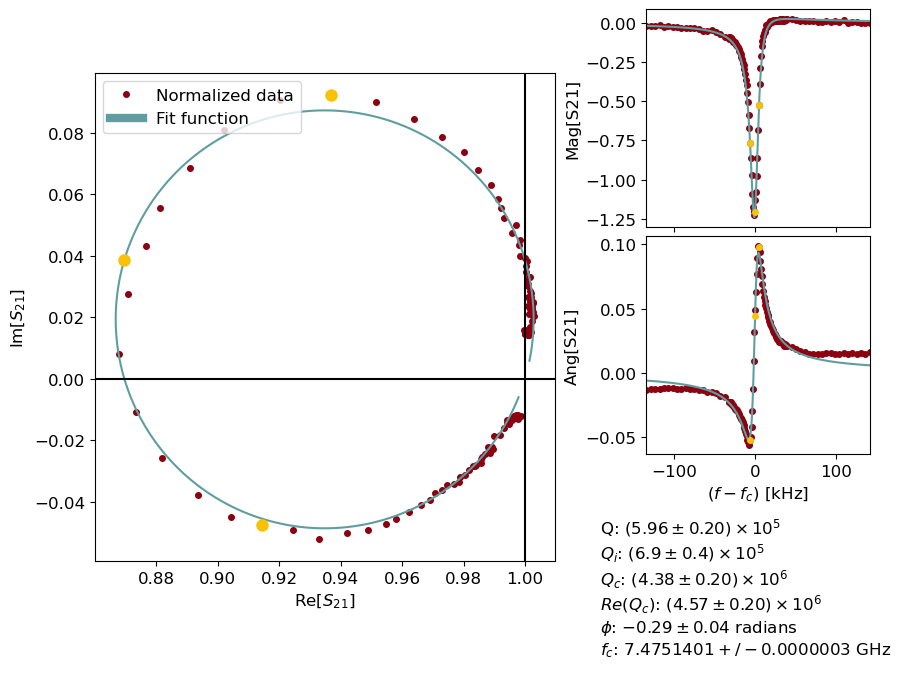

-36.020599913279625


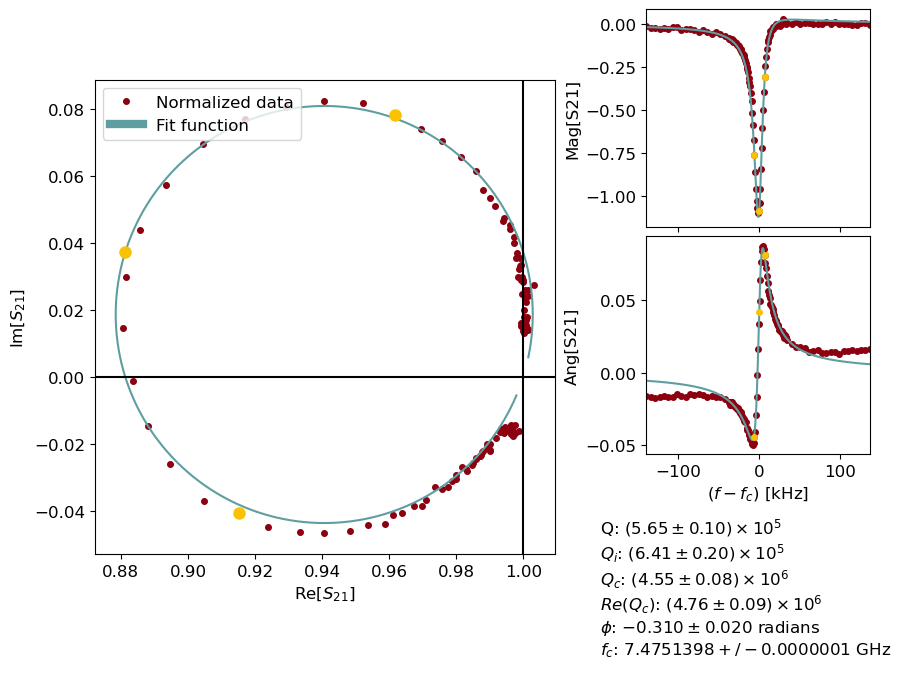

-42.04119982655925


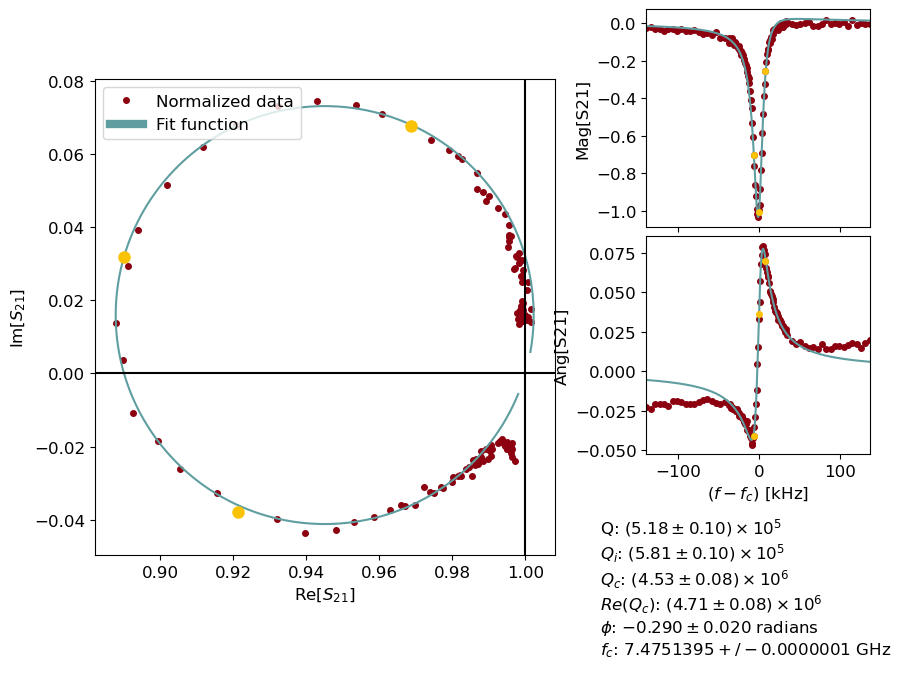

-48.061799739838875


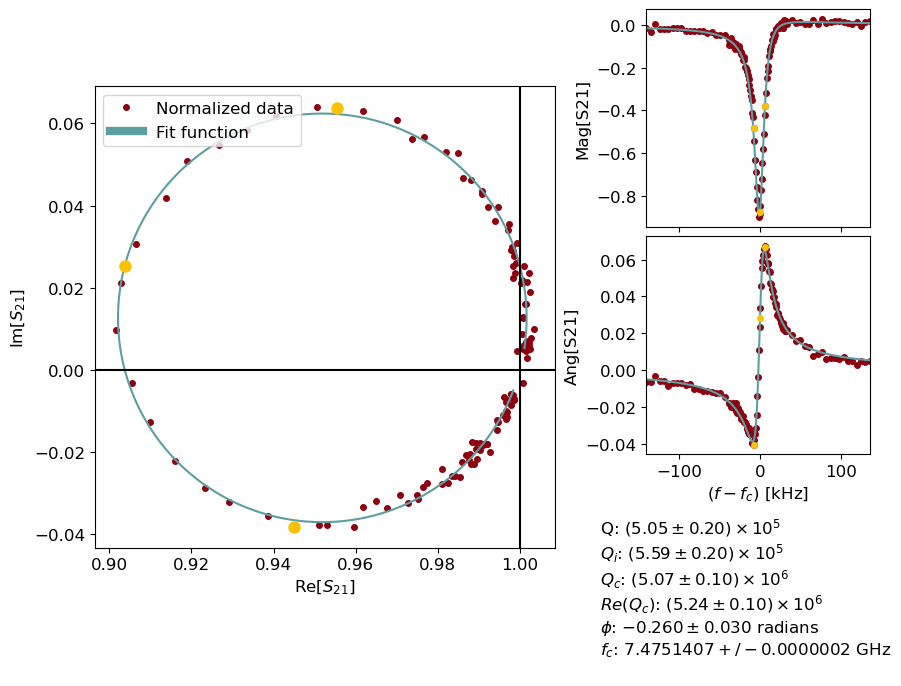

-54.0823996531185


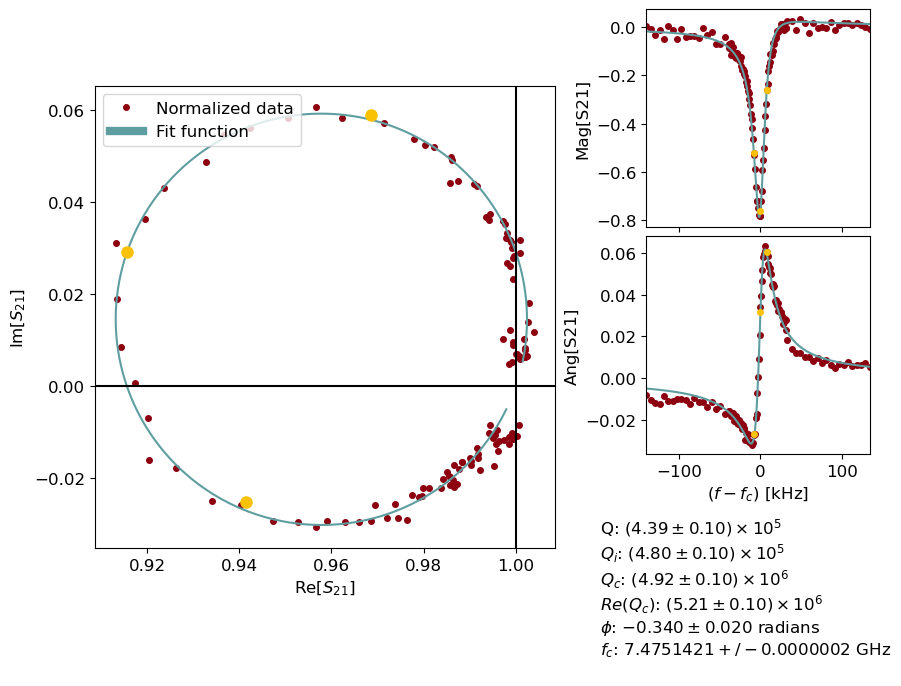

-60.102999566398125


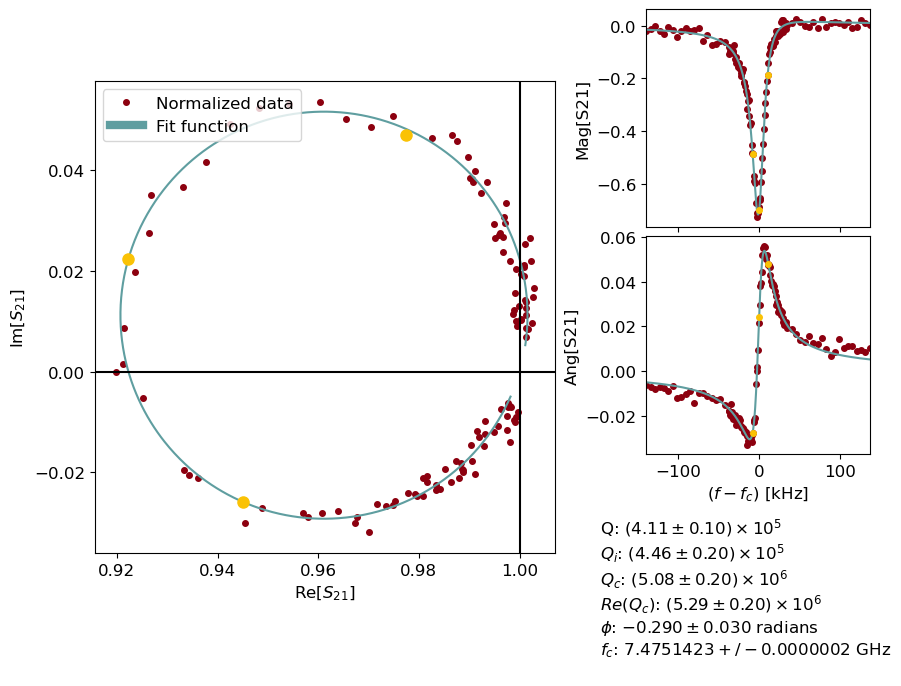

-66.12359947967775


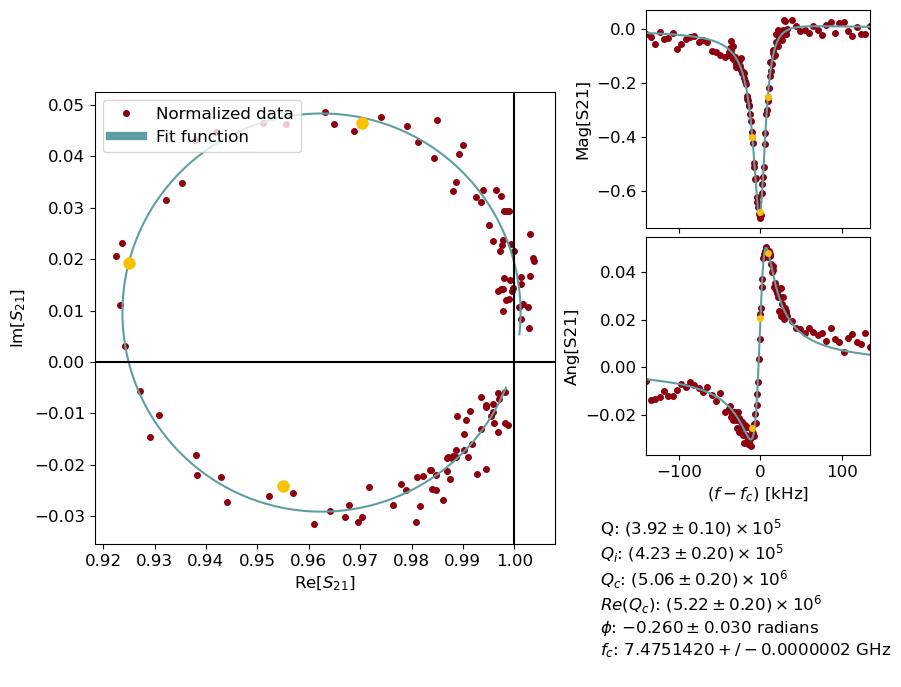

-72.14419939295738


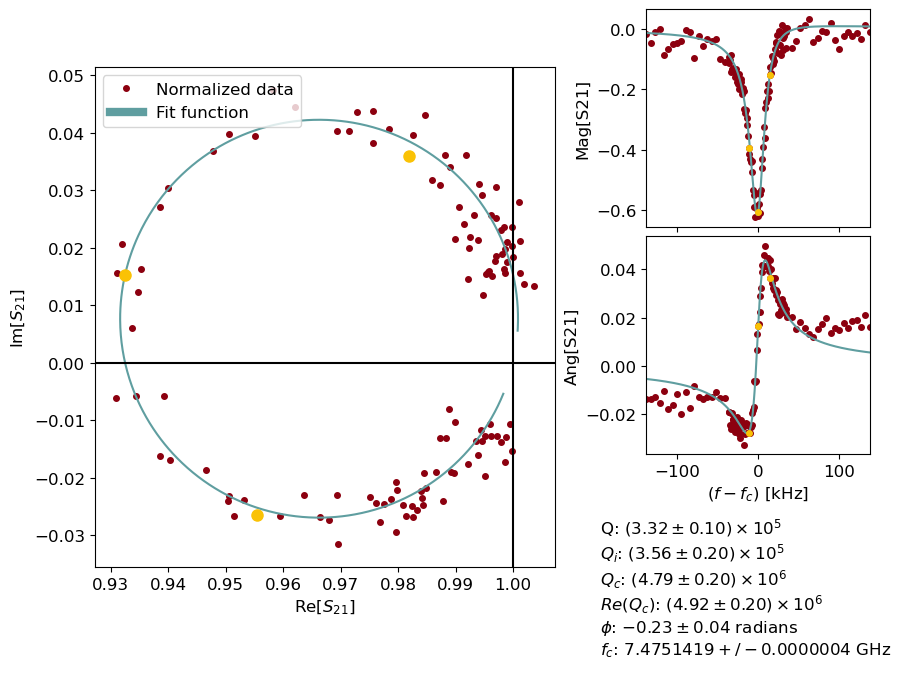

-78.164799306237


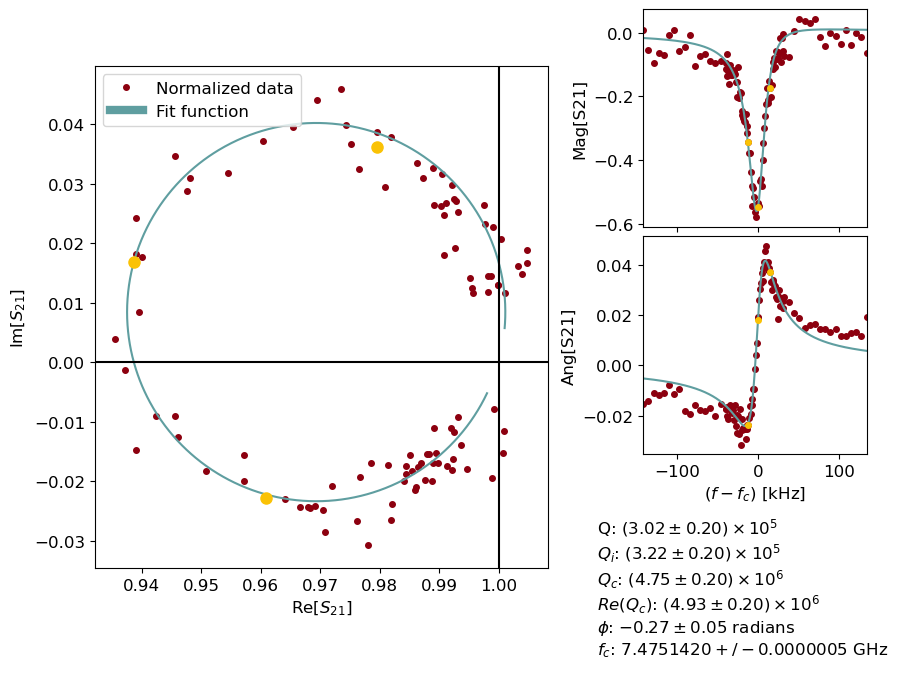

Time elapsed:  72.60202121734619
-30.0


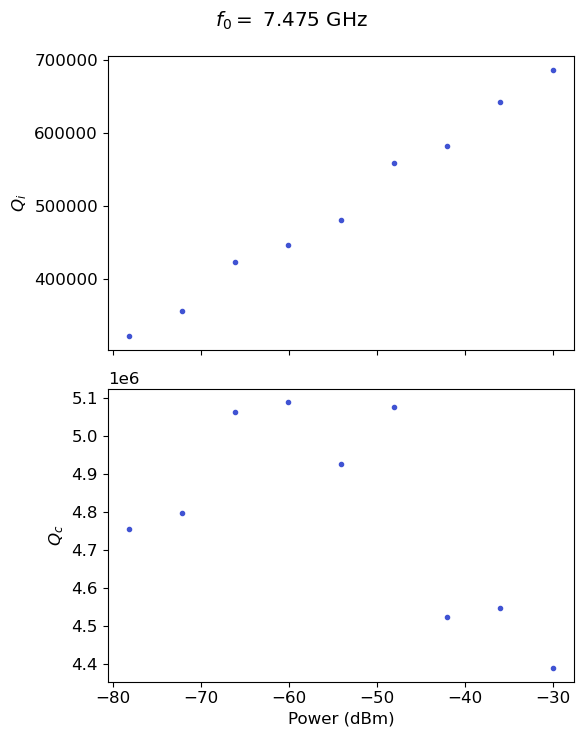

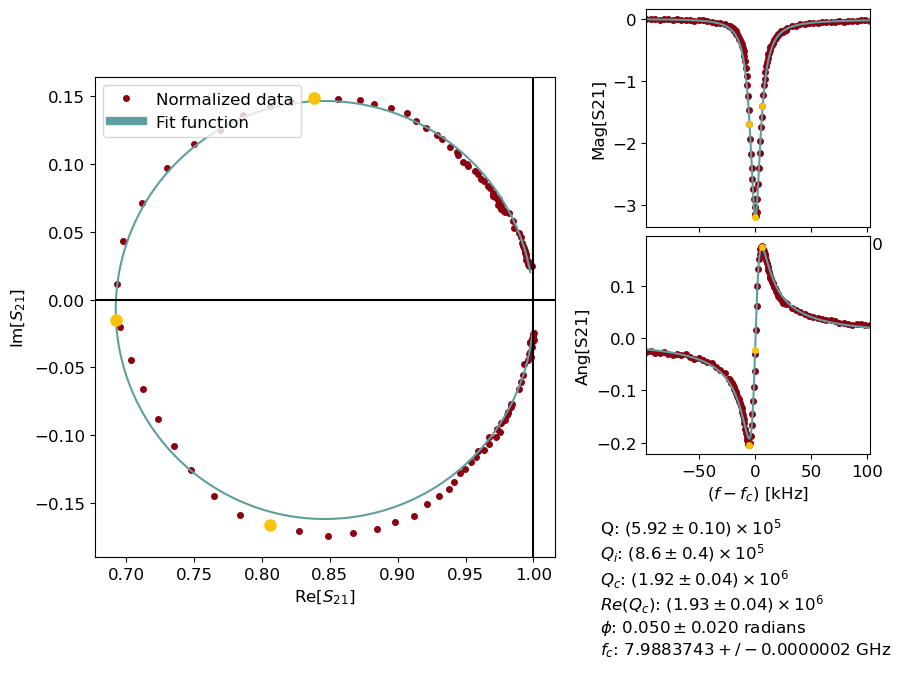

-36.020599913279625


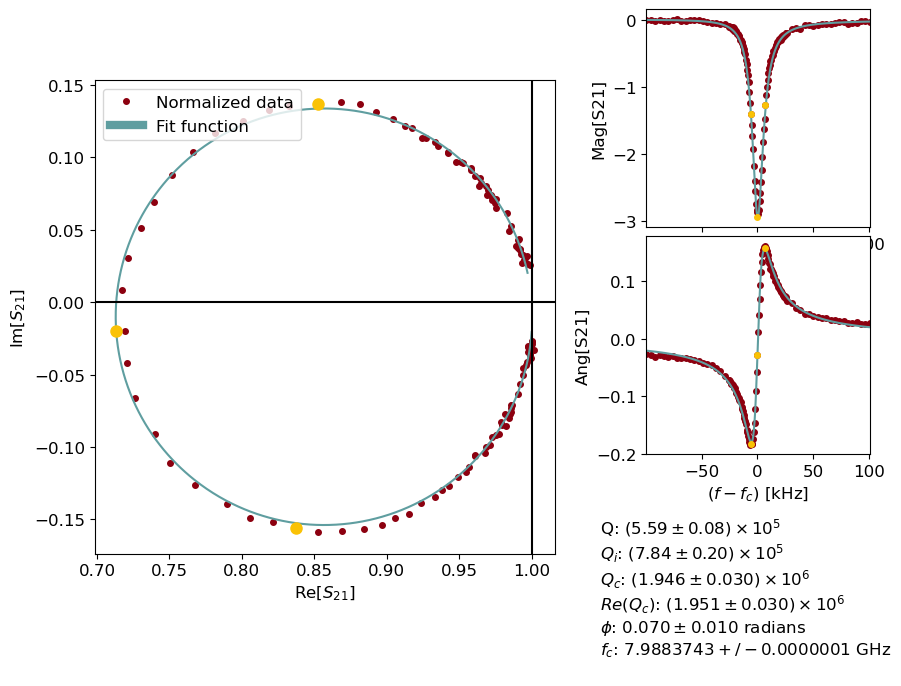

-42.04119982655925


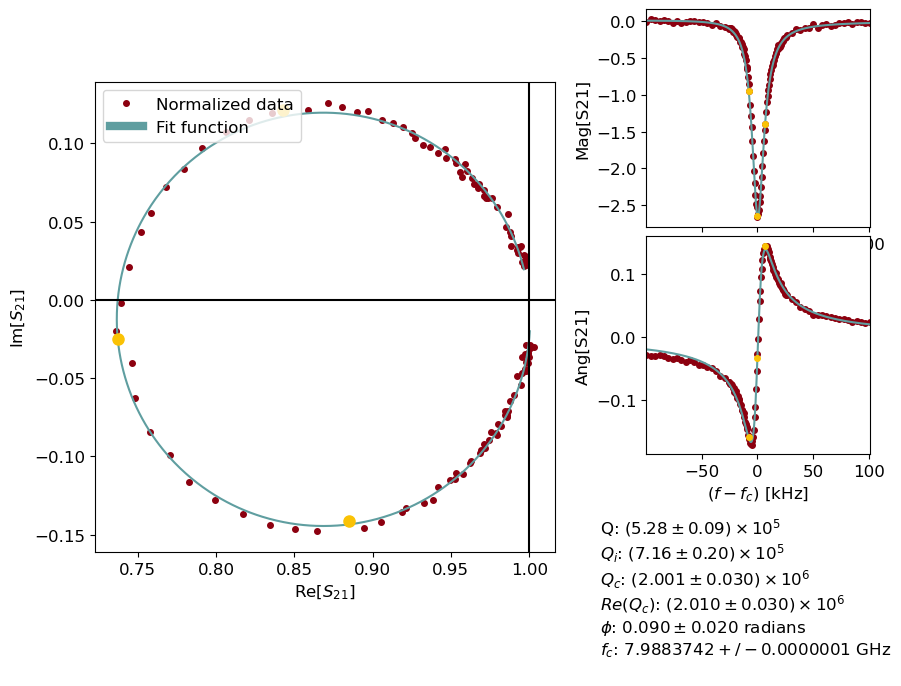

-48.061799739838875


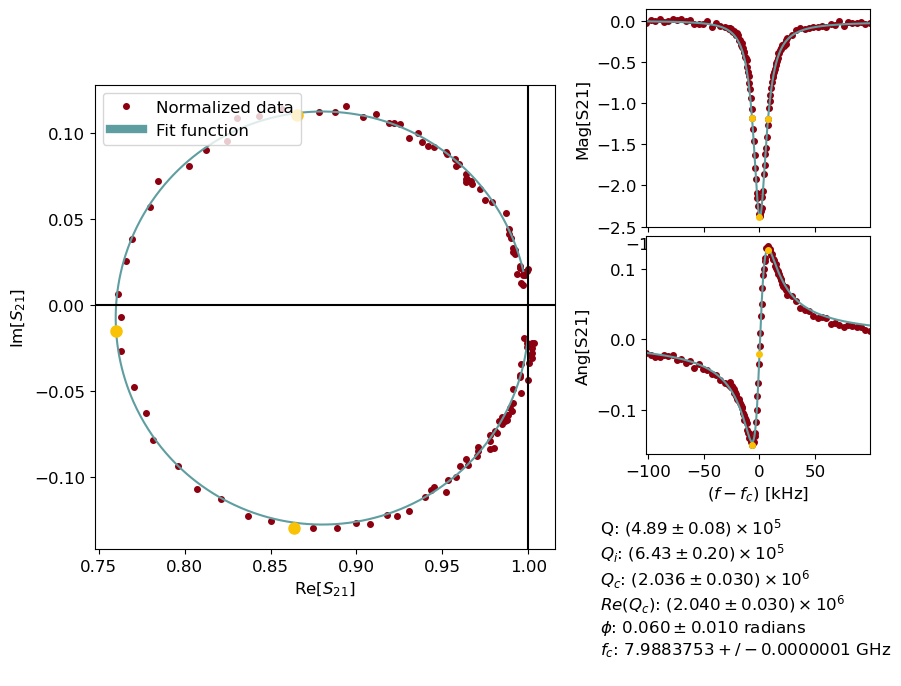

-54.0823996531185


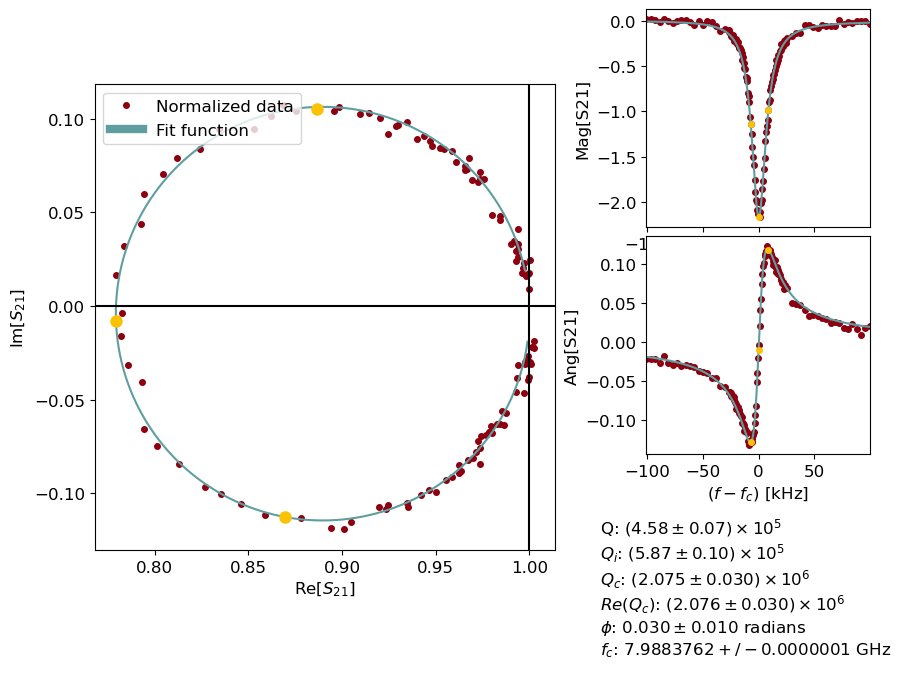

-60.102999566398125


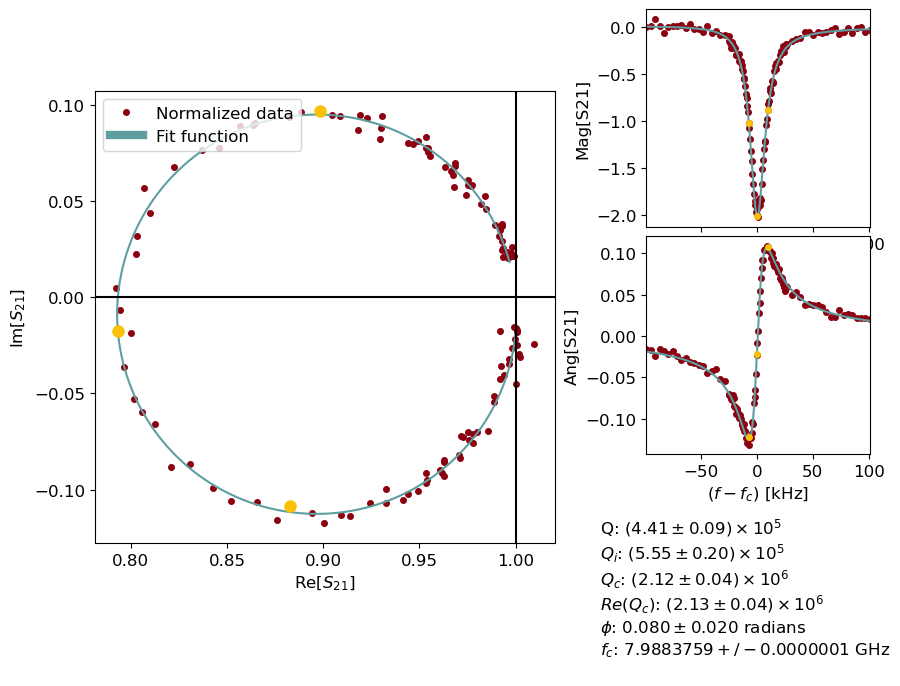

-66.12359947967775


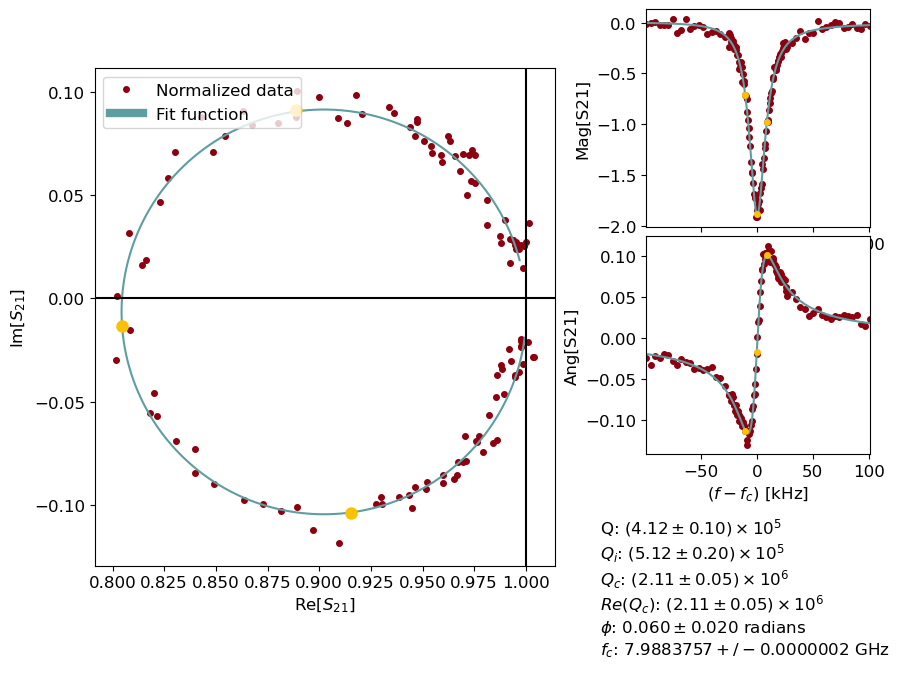

-72.14419939295738


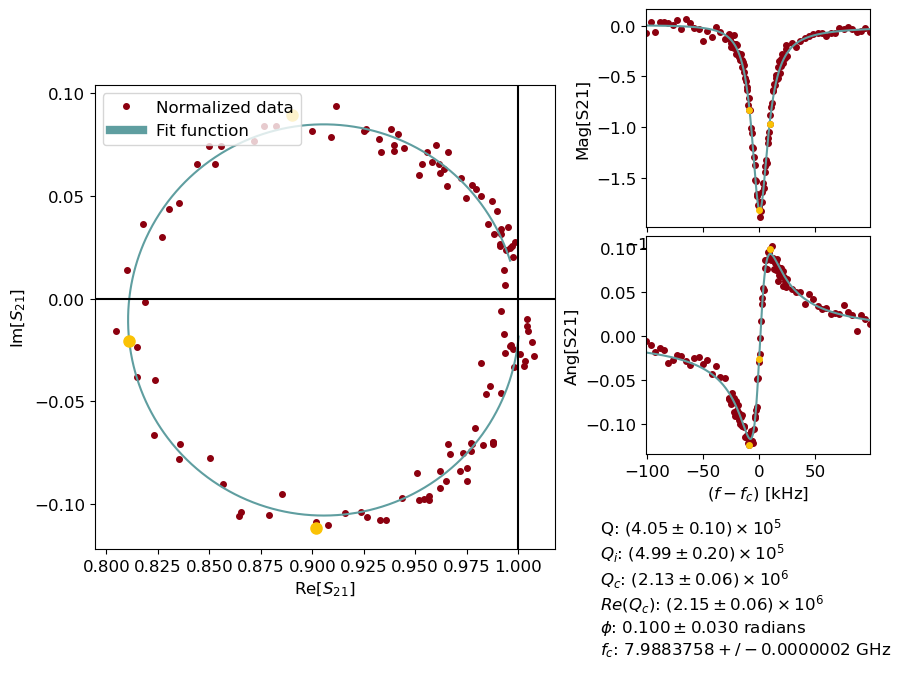

-78.164799306237


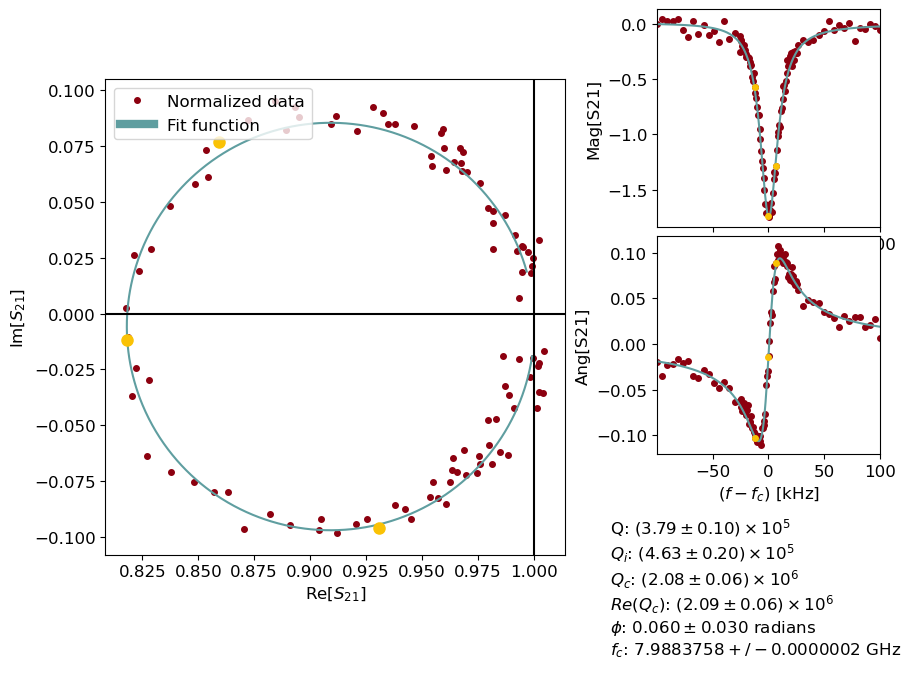

Time elapsed:  81.07923436164856


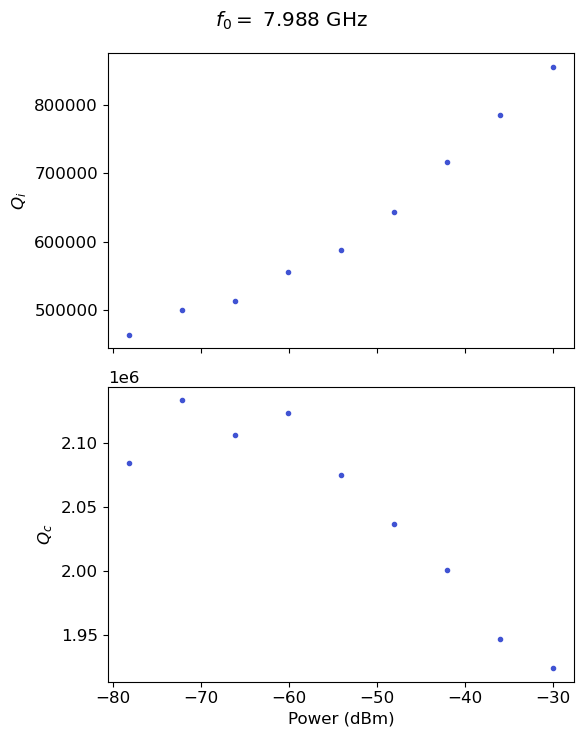

In [5]:
res_params = ana_res.analyze_sweep_gen(params['dir'][ind], data_pth, name=meas, img_pth=img_pth, plot=True, nfiles=params['nfiles'][ind], fix_freq=True, meas_type=params['meas_type'][ind], slope=1130.85)

Counter({5983: 10, 6321: 10, 6680: 10, 6692: 10, 6993: 9, 7068: 9, 7475: 9, 7988: 9})
Counter({5983: 10, 6321: 10, 6680: 10, 6692: 10, 6993: 9, 7068: 9, 7475: 9, 7988: 9})
['res_5983_32768_wideleft', 'res_5983_16384_wideleft', 'res_5983_8192_wideleft', 'res_5983_4096_wideleft', 'res_5983_2048_wideleft', 'res_5983_1024_wideleft', 'res_5983_512_wideleft', 'res_5983_256_wideleft', 'res_5983_128_wideleft', 'res_5983_64_wideleft']
['res_6321_32768_wideleft', 'res_6321_16384_wideleft', 'res_6321_8192_wideleft', 'res_6321_4096_wideleft', 'res_6321_2048_wideleft', 'res_6321_1024_wideleft', 'res_6321_512_wideleft', 'res_6321_256_wideleft', 'res_6321_128_wideleft', 'res_6321_64_wideleft']
['res_6680_32768_wideleft', 'res_6680_16384_wideleft', 'res_6680_8192_wideleft', 'res_6680_4096_wideleft', 'res_6680_2048_wideleft', 'res_6680_1024_wideleft', 'res_6680_512_wideleft', 'res_6680_256_wideleft', 'res_6680_128_wideleft', 'res_6680_64_wideleft']
['res_6692_32768_wideleft', 'res_6692_16384_wideleft',

Traceback (most recent call last):
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 734, in plot_all
    data, _ = load_resonator(
              ^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 694, in load_resonator
    data3, _ = grab_data(pth, file3, meas_type, slope)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\scresonators\fit_resonator\ana_resonator.py", line 141, in grab_data
    data, attrs = hy.prev_data(pth, fname)
                  ^^^^^^^^^^^^^^^^^^^^^^^^
  File "g:\My Drive\Projects\Materials\materials-software\scresonators\fit_resonator\../..\meas_analysis\handy.py", line 12, in prev_data
    with SlabFile(temp_data_file) as a:
         ^^^^^^^^^^^^^^^^^^^^^^^^
  File "g:\My

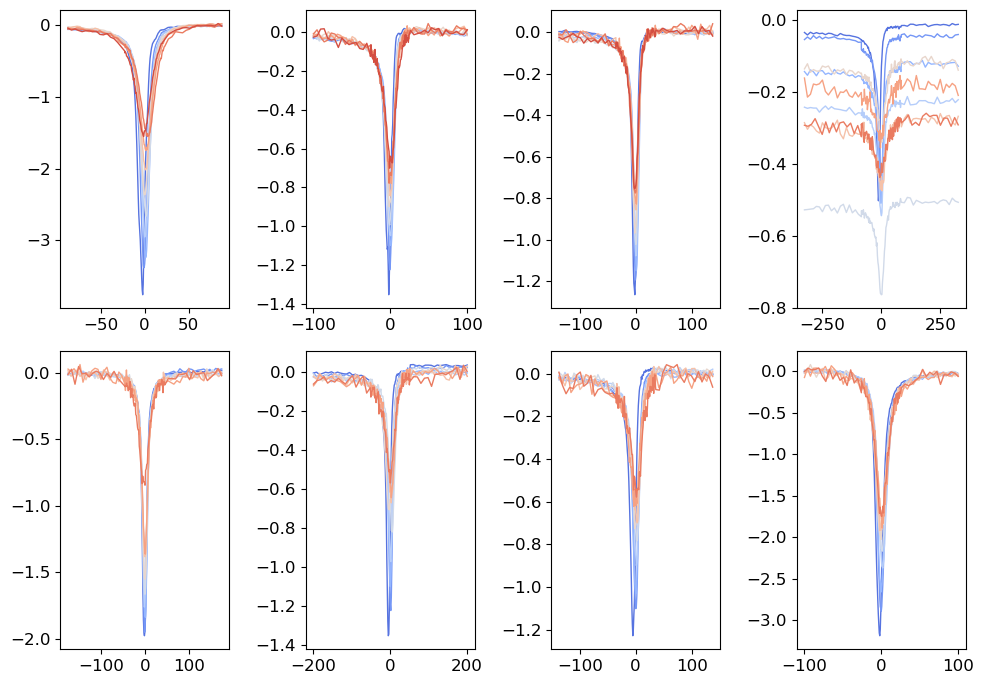

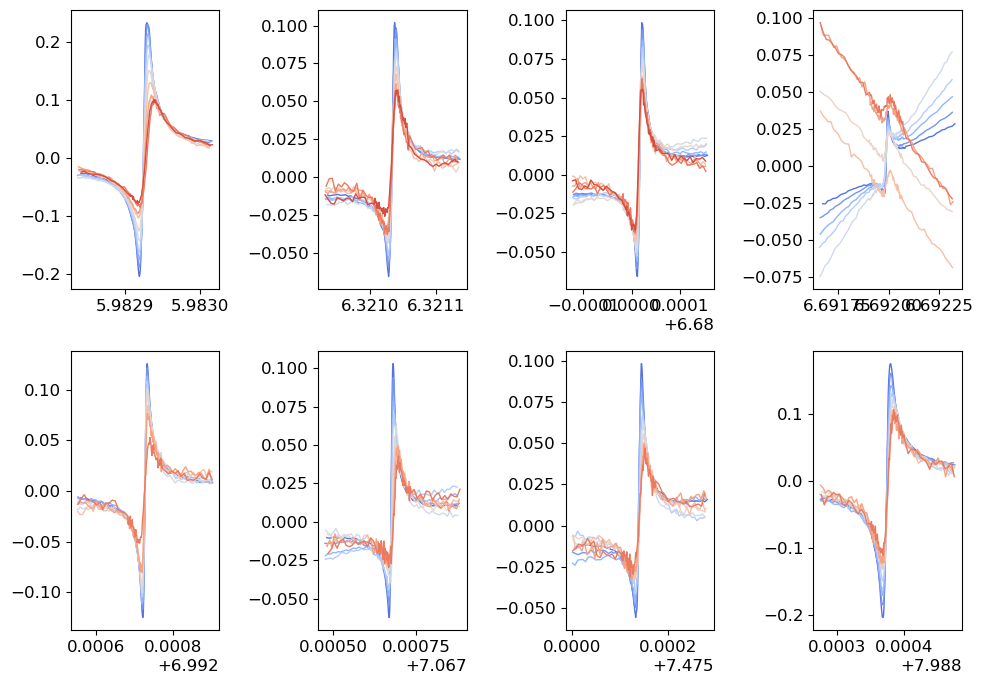

In [6]:


#slope = 0
%matplotlib inline
frac = 7.714986
fnames = ana_res.plot_all(params['dir'][ind], data_pth, output_path=img_pth, max_power=-15, norm=True, half_norm=False, nfiles=params['nfiles'][ind], meas_type=params['meas_type'][ind],slope=1130.85, circ=False)#, slope=slope)

In [7]:
#fnames, res_params = ana_res.analyze_sweep_other(params['dir'][ind], data_pth, output_path=img_pth, max_power=-15, nfiles=params['nfiles'][ind], meas_type=params['meas_type'][ind],slope=slope)#, slope=slope)

#### Reorder the data based on pitch (only run once)

In [8]:

if params['meas_type']=='soc':
    res_params = ana_res.convert_power(res_params) 

params, res_params=ana_res.reorder(params, res_params) # only run once!
params['qc'] = np.array([np.nanmedian(res_params[i]['qc']) for i in range(len(res_params))])
params['qc_err'] = np.array([np.nanmedian(res_params[i]['qc_err']) for i in range(len(res_params))])
params['freqs'] = np.array([np.nanmedian(res_params[i]['freqs']) for i in range(len(res_params))])
params['phs'] = np.array([np.nanmedian(res_params[i]['phs']) for i in range(len(res_params))])

In [9]:
res_params[0]['qi'][0]

array([365681.1904,    589.9435,    562.0562,   7947.4566,      7.3821,
               nan, -92041.3089,         nan,         nan])

### Power sweep and TLS fits

Error in plotting
Failed!
Failed!
Failed!
Failed!


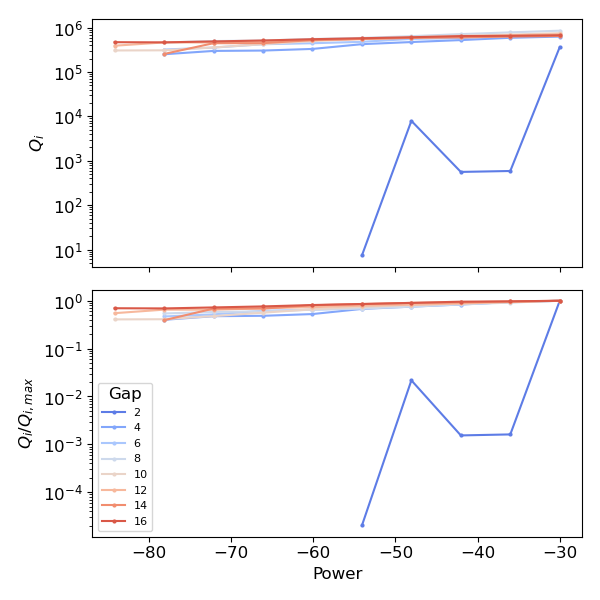

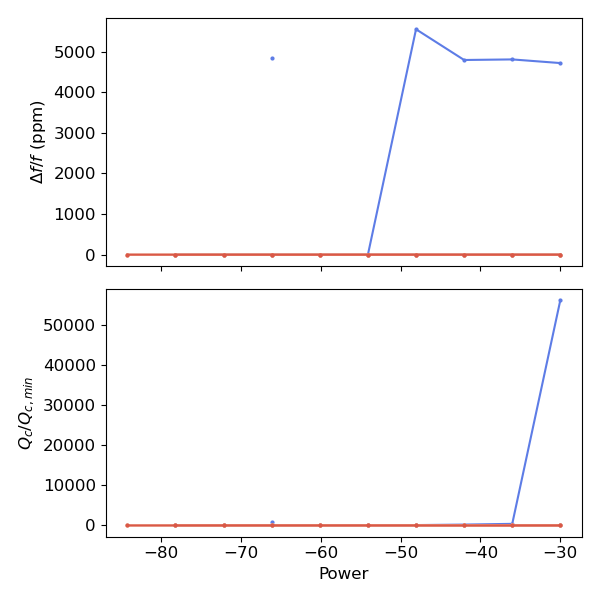

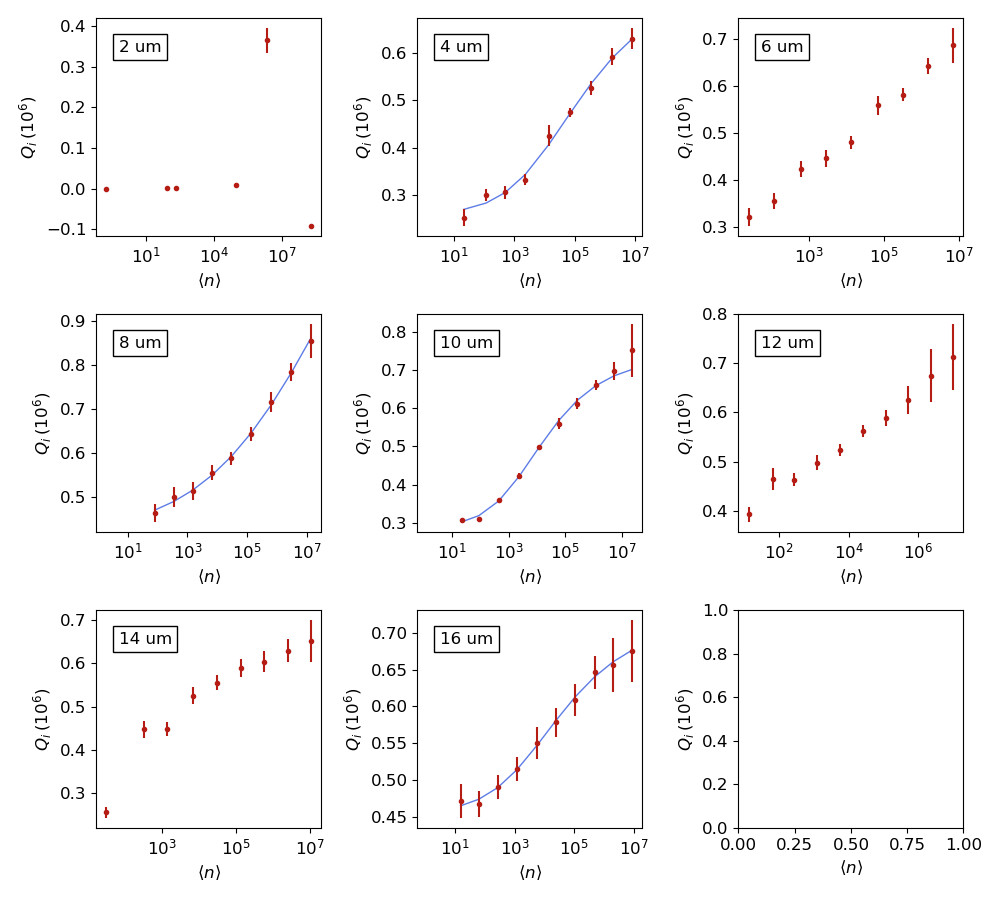

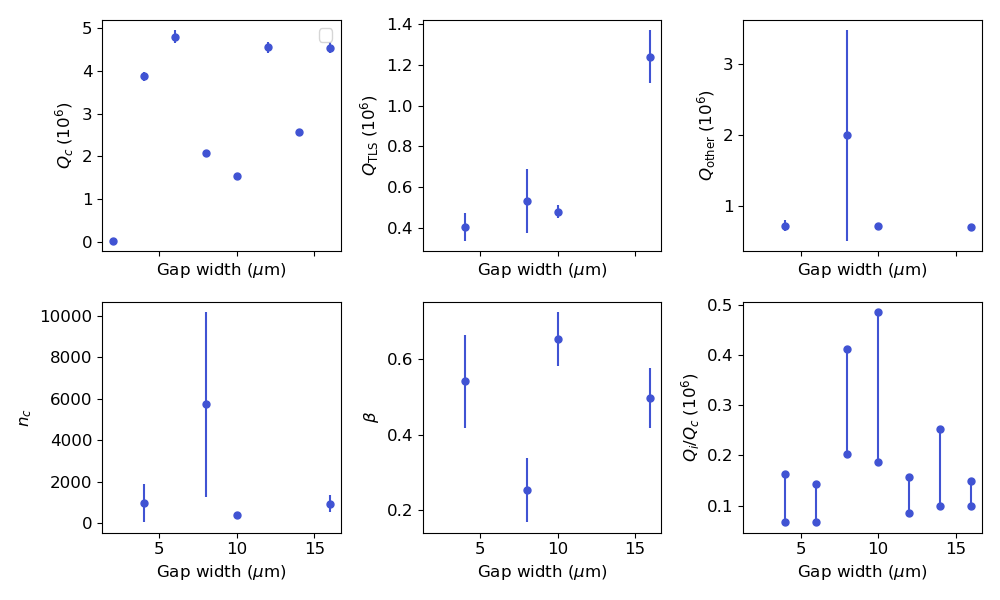

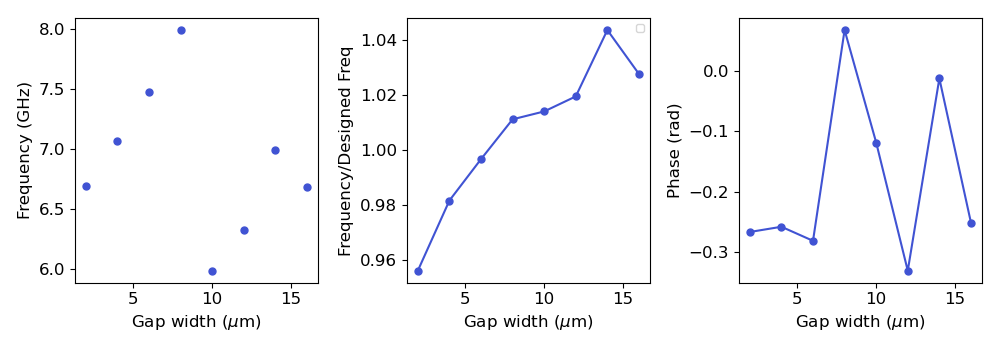

In [10]:
%matplotlib widget
ana_res.plot_power(res_params, params, img_pth, use_pitch=True)

# min_power = [-135, -135, -100, -135, -135, -135, -100, -130]
# max_power = [24, 18, 0, 35, 37, -30, 18, 23]

min_power = [-135, -135, -100, -135, -135, -135, -100, -130]
max_power = [24, 18, 0, 35, 37, 0, 18, 23]

cfg = ana_tls.fit_qi(res_params, params, img_pth, max_power_vec = max_power, min_power_vec = min_power) 
# params['qtls0'][2] = float('nan')
# params['qother'][2] = float('nan')

ana_tls.plot_res_pars([params], [''],img_pth)
ana_res.plot_res_pars([params], [''], img_pth)
hy.save_np(params, img_pth+'Text/' + params['meas'][ind] + '.yml')


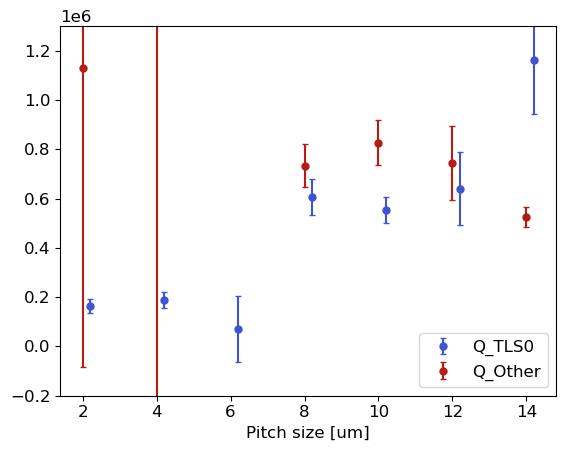

In [125]:
pitch_list = params['pitch']
qtls0 = params['qtls0']
qtls0_err = params['qtls0_err']
qother = params['qother']
qother_err = params['qother_err']

%matplotlib inline
plt.errorbar(np.array(pitch_list)+0.2, qtls0, yerr = qtls0_err, fmt='.', label = 'Q_TLS0', capsize = 2)
plt.errorbar(pitch_list, qother, yerr = qother_err, fmt='.', label = 'Q_Other', capsize = 2)
plt.xlabel('Pitch size [um]')
plt.legend()
plt.ylim(-0.2*10**6, 1.3*10**6)
plt.show()




In [107]:
params

{'atten': -50,
 'dir': [['powersweep3'], ['powersweep5'], ['powersweep6'], ['powersweep1']],
 'flip': True,
 'max_power': 25,
 'meas': ['silicon-no-waffle',
  'silicon-no-waffle_lopower',
  'silicon-no-waffle2',
  'silicon-waffle'],
 'meas_type': ['soc', 'soc', 'soc', 'soc'],
 'min_power': -100,
 'nfiles': [3, 3, 3, 3],
 'pitch': [2, 4, 6, 8, 10, 12, 14, 16],
 'pth': '241104-Resonator/',
 'target_freq': [7, 7.2, 7.5, 7.9, 5.9, 6.2, 6.5, 6.7],
 'temp': 0.04,
 'qc': array([5310493.0988, 3921384.2356, 4750783.911 , 1961581.7718,
        1529335.4791, 4751895.2588, 5009973.0863, 2636164.9255]),
 'qc_err': array([133694.7388, 122886.296 , 114741.6252,  31169.0051,  10620.7044,
         92095.9583, 117262.2053,  48954.572 ]),
 'freqs': array([6.6920e+09, 7.0677e+09, 7.4751e+09, 7.9884e+09, 5.9829e+09,
        6.3210e+09, 6.6800e+09, 6.9927e+09]),
 'phs': array([-0.1632, -0.3034, -0.247 ,  0.0778,  0.0714, -0.2909, -0.2266,
         0.0042]),
 'qtls0': array([         nan,   53592.228 ,  2840

### Plot with different max and min power for each resonator 

Failed!


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


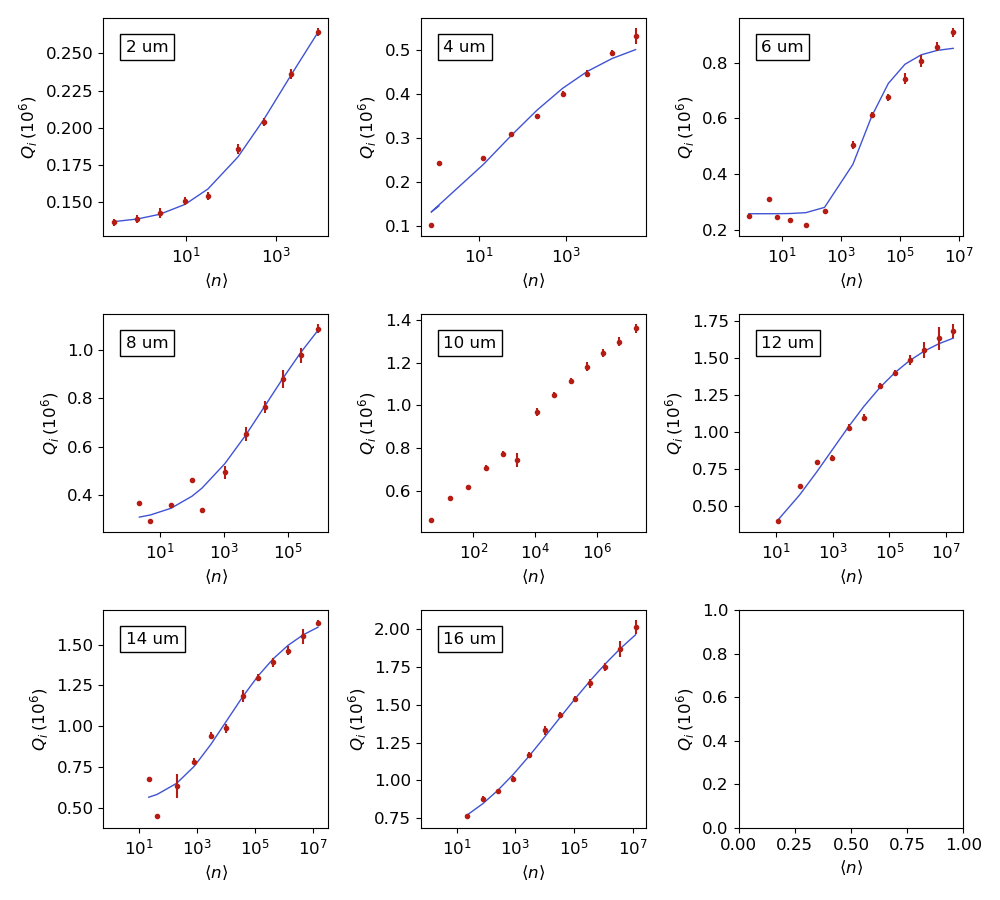

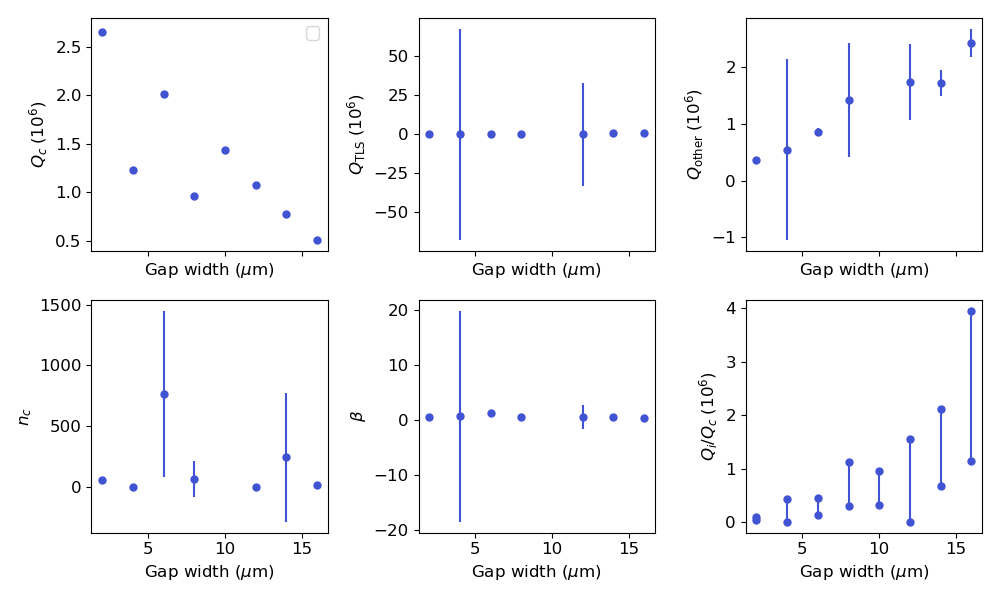

In [70]:
if sample == 'hf3':
    max_power = [-40, -50, -35, -40, -25, -25, -25, -25]

    cfg = ana_tls.fit_qi(res_params, params, img_pth, max_power_vec = max_power) 
    ana_tls.plot_res_pars([params], [''],img_pth)
    #params_nohf_low_pow = copy.deepcopy(params)
    params_hf = copy.deepcopy(params)
else:
    max_power = [-35, -35, -15, -25, -15, -15, -15, -15]
    min_power = [-115, -115, -115, -115, -100, -95, -90, -90]
    
    cfg = ana_tls.fit_qi(res_params, params, img_pth, max_power_vec = max_power, min_power_vec = min_power) 
    ana_tls.plot_res_pars([params], [''],img_pth)
    params_no_hf = copy.deepcopy(params)

### Print out info for running scans

In [9]:
lw=[]
freq =[]
print('linewidth')
for i in range(len(params['freqs'])):
    q = 1/(1/params['qi0'][i]+1/params['qc'][i])
    lw.append(params['freqs'][i]/q)
    freq.append(params['freqs'][i])

print(lw)
print(freq)

linewidth
[62108.84999872619, 31754.88651060028, 35928.47570952304, 29346.31301041099, 14571.561073889929, 14732.344817108129, 17533.865679245962, 19348.403941294877]
[6336553046.740015, 6692450581.395647, 7056426236.336695, 7382931608.965666, 5516761886.202525, 5820846804.326765, 6091775267.869023, 6376982672.309232]


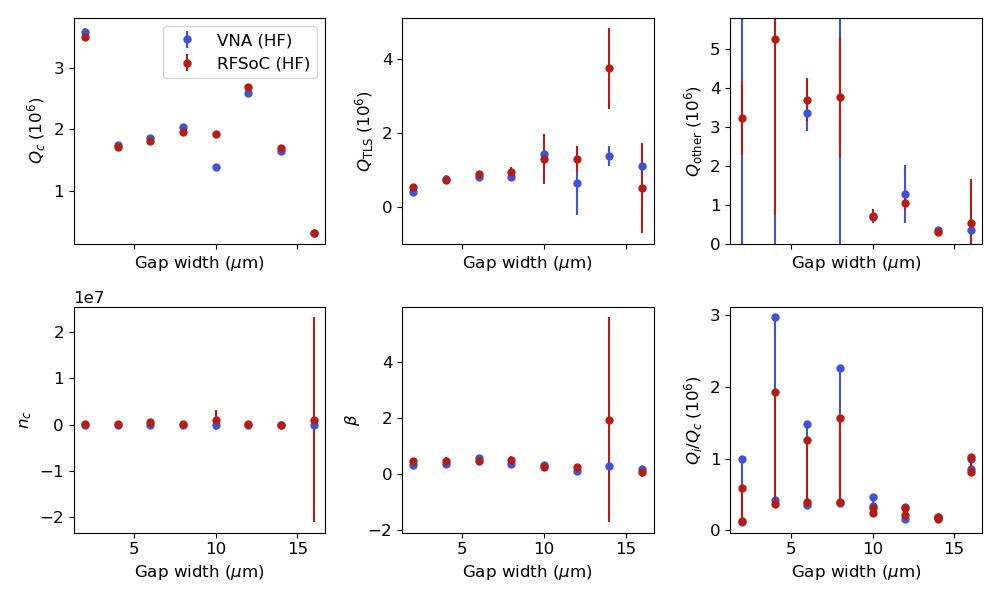

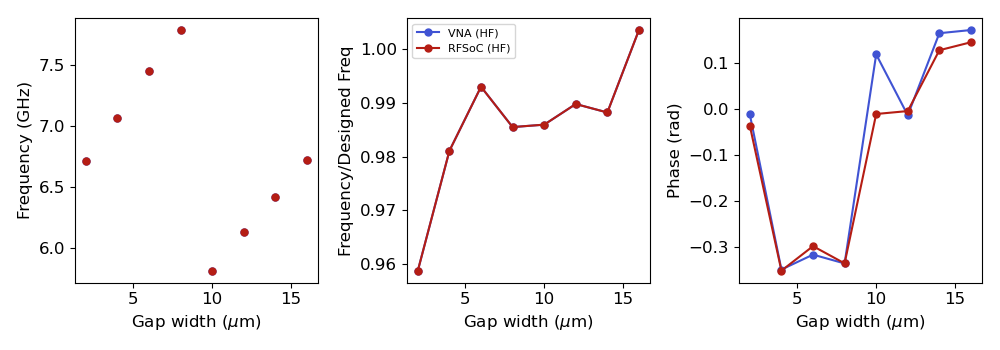

In [ ]:
%matplotlib widget
#pnames = ['240814-2','240725','240729-2', '240729-4']
#labs = ['ScalinQ (No HF)', 'SLab (No HF)', 'SLab (HF)', 'RFSoC (HF)'] 

#pnames = ['240729-2', '240729-3']
pnames = ['240729-3', '240820_soc']
labs = ['VNA (HF)', 'RFSoC (HF)'] 
plist =[]
for p in pnames:
    plist.append(hy.load(img_pth +'Text/'+ p + '.yml'))

ana_tls.plot_res_pars(plist, labs,img_pth)
ana_res.plot_res_pars(plist, labs,img_pth)


## Single resonators

### Get list of resonators

In [ ]:
# Grab list of resonators following corect format in directory. 

pattern0 = r'res_(\d+)_\d{2,5}dbm'
resonators, file_list0 = ana_res.get_resonators(directories[0],pth, pattern0)

pattern = 'res_{:d}_'.format(resonators[0]) + '(\d{2,3})dbm'
file_list = ana_res.get_resonator_power_list(pattern, file_list0)

### Fit slope for RFSoC phase correction

In [ ]:
pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240816-Resonator'

plt.figure()
data, attrs = hy.prev_data(pth, 'test2')
plt.plot(data['xpts'][0], data['phases'][0])
slope, ofs = np.polyfit(data['xpts'][0], np.unwrap(data['phases'][0]), 1)
data['phases'] = np.unwrap(data['phases'][0]) - slope * data['xpts'][0]-ofs

print(slope)

data['phases']

In [ ]:
# Grab list of resonators following corect format in directory. 

pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240818-Resonator/'

#directories = ['240816-Resonator/powersweep3']
directories = ['powersweep2']
pattern0 = r'res_(\d+)_\d'
resonators, file_list = ana_res.get_resonators(directories[0],pth, pattern0)

In [ ]:
fname =  'res_6423_4096_wideright'
data, attrs = hy.prev_data(pth+directories[0], fname)

data.keys()

Single resonator

In [ ]:
data = ana_res.grab_data(pth+directories[0], file_list[4], 'soc', slope=slope)
#ana_res.plot_raw_data(data)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   

In [ ]:
sorted_file_list = sorted(file_list)
print(sorted_file_list)

In [ ]:
file_list[12]

In [ ]:
%matplotlib widget

for i in range(len(file_list)):
    #try:
    data = ana_res.grab_data(pth+directories[0], file_list[i])       
    ana_res.plot_raw_data(data)
    #output = ana_res.fit_resonator(data, file_list[i], output_path, 'png')    
    #except: 
    #    print('fit failed')  
7.714986

In [ ]:

pth = '../../../../JJ_fab/Coherence Sample/Resonators Measurement/240725/data/power_sweep5'
fname = 'res_7083855_60dbm_wide'
data = ana_res.grab_data(pth, fname)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   
ana_res.plot_raw_data(data)

## Temp sweep

In [ ]:
# Initialize the directories list for a temperature sweep 
temps, directories = ana_res.get_temp_list(pth_base, max_temp=1500)
res_params = ana_res.analyze_sweep(directories)

ana_res.plot_power_temp(res_params,i,params,img_pth)